In [4]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import mplhep as hep

from scipy.stats import wasserstein_distance

plt.style.use(hep.cms.style.ROOT)
plt.rcParams['axes.axisbelow'] = True

In [26]:
model_name = 'seed_nominal'
modelDir = '/net/scratch_cms3a/hschoenen/deepjet/results/{}'.format(model_name)
#saveDir = '/net/scratch_cms3a/hschoenen/deepjet/plots'
saveDir = '/home/home1/institut_3a/hschoenen/plots'

def get_array(quantity,attack='nominal'):
    array = np.load('{}/variables/{}/{}.npy'.format(modelDir,attack,quantity))
    return array

# epsilons for adversarial attacks
global_deltas = np.load('/home/home1/institut_3a/hschoenen/repositories/DeepJet/epsilons/global_standardized_epsilons.npy')
cpf_deltas = np.load('/home/home1/institut_3a/hschoenen/repositories/DeepJet/epsilons/cpf_standardized_epsilons.npy')
npf_deltas = np.load('/home/home1/institut_3a/hschoenen/repositories/DeepJet/epsilons/npf_standardized_epsilons.npy')
vtx_deltas = np.load('/home/home1/institut_3a/hschoenen/repositories/DeepJet/epsilons/vtx_standardized_epsilons.npy')
input_deltas = {
    'glob': global_deltas,
    'cpf': cpf_deltas,
    'npf': npf_deltas,
    'vtx': vtx_deltas,
}

# get truth flavor information
isB = get_array('isB')
isBB = get_array('isBB')
isLeptonicB = get_array('isLeptonicB')
isC = get_array('isC')
isUDS = get_array('isUDS')
isG = get_array('isG')
# print number of jets in each category
flavours = [isB,isBB,isLeptonicB,isC,isUDS,isG]
flavour_names = ['isB','isBB','isLeptonicB','isC','isUDS','isG']
sum = 0
for i in range(len(flavours)):
    print('{}: {:n}'.format(flavour_names[i], np.sum(flavours[i])))
    sum += np.sum(flavours[i])
print('total: {:n}'.format(sum))
# summarize jet flavors
B = isB + isBB + isLeptonicB
C = isC
L = isUDS + isG

TypeError: 'int' object is not callable

In [ ]:
# calculate Kullack-Leibler divergence
def kldiv(A, B):
        return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])

# calculate Jensen-Shannon divergence
def jsdiv(P, Q, normalize_first=False):
    P = np.array(P)
    Q = np.array(Q)
    if normalize_first:
        P = P/P.sum()
        Q = Q/Q.sum()
    M = 0.5 * (P + Q)
    return 0.5 * (kldiv(P, M) +kldiv(Q, M))

attack_labels = {
    'nominal': 'nominal',
    'fgsm-0_01': r'fgsm $\epsilon=0.01$',
    'fgsm-0_05': r'fgsm $\epsilon=0.05$',
    'fgsm-0_1': r'fgsm $\epsilon=0.1$',
    'gaussian-0_1': r'gaussian $\epsilon=0.1$',
    'gaussian-5': r'gaussian $\epsilon=5$',
}
attack_colors = {
    'nominal': 'tab:blue',
    'fgsm-0_01': 'tab:orange',
    'fgsm-0_05': 'tab:orange',
    'fgsm-0_1': 'tab:red',
    'gaussian-0_1': 'tab:green',
    'gaussian-5': 'tab:green',
}
    
quantity_labels = {
    # global
    'jet_pt': '$p_{T}[GeV]$', 
    'jet_eta': '$\eta$',
    'nCpfcand': '$N_{CPF}$',
    'nNpfcand': '$N_{NPF}$',
    'nsv': '$N_{SV}$',
    'npv': '$N_{PV}$',
    'TagVarCSV_trackSumJetEtRatio': 'TagVarCSV_trackSumJetEtRatio',
    'TagVarCSV_trackSumJetDeltaR': 'TagVarCSV_trackSumJetDeltaR',
    'TagVarCSV_vertexCategory': 'TagVarCSV_vertexCategory',
    'TagVarCSV_trackSip2dValAboveCharm': 'TagVarCSV_trackSip2dValAboveCharm',
    'TagVarCSV_trackSip2dSigAboveCharm': 'TagVarCSV_trackSip2dSigAboveCharm',
    'TagVarCSV_trackSip3dValAboveCharm': 'TagVarCSV_trackSip3dValAboveCharm',
    'TagVarCSV_trackSip3dSigAboveCharm': 'TagVarCSV_trackSip3dSigAboveCharm',
    'TagVarCSV_jetNSelectedTracks': 'TagVarCSV_jetNSelectedTracks',
    'TagVarCSV_jetNTracksEtaRel': 'TagVarCSV_jetNTracksEtaRel',
    # cpf
    'Cpfcan_BtagPf_trackEtaRel': 'Cpfcan_BtagPf_trackEtaRel',
    'Cpfcan_BtagPf_trackPtRel': 'Cpfcan_BtagPf_trackPtRel',
    'Cpfcan_BtagPf_trackPPar': 'Cpfcan_BtagPf_trackPPar',
    'Cpfcan_BtagPf_trackDeltaR': 'Cpfcan_BtagPf_trackDeltaR',
    'Cpfcan_BtagPf_trackPParRatio': 'Cpfcan_BtagPf_trackPParRatio',
    'Cpfcan_BtagPf_trackSip2dVal': 'Cpfcan_BtagPf_trackSip2dVal',
    'Cpfcan_BtagPf_trackSip2dSig': 'Cpfcan_BtagPf_trackSip2dSig',
    'Cpfcan_BtagPf_trackSip3dVal': 'Cpfcan_BtagPf_trackSip3dVal',
    'Cpfcan_BtagPf_trackSip3dSig': 'Cpfcan_BtagPf_trackSip3dSig',
    'Cpfcan_BtagPf_trackJetDistVal': 'Cpfcan_BtagPf_trackJetDistVal',
    'Cpfcan_ptrel': 'Cpfcan_ptrel',
    'Cpfcan_drminsv': 'Cpfcan_drminsv',
    'Cpfcan_VTX_ass': 'Cpfcan_VTX_ass',
    'Cpfcan_puppiw': 'Cpfcan_puppiw',
    'Cpfcan_chi2': 'Cpfcan_chi2',
    'Cpfcan_quality': 'Cpfcan_quality',
    # npf
    'Npfcan_ptrel': 'Npfcan_ptrel', 
    'Npfcan_deltaR': 'Npfcan_deltaR',
    'Npfcan_isGamma': 'Npfcan_isGamma', 
    'Npfcan_HadFrac': 'Npfcan_HadFrac', 
    'Npfcan_drminsv': 'Npfcan_drminsv', 
    'Npfcan_puppiw': 'Npfcan_puppiw',
    # vtx
    'sv_pt': 'sv_pt',
    'sv_deltaR': 'sv_deltaR',
    'sv_mass': 'sv_mass',
    'sv_ntracks': 'sv_ntracks',
    'sv_chi2': 'sv_chi2',
    'sv_normchi2': 'sv_normchi2',
    'sv_dxy': 'sv_dxy',
    'sv_dxysig': 'sv_dxysig',
    'sv_d3d': 'sv_d3d',
    'sv_d3dsig': 'sv_d3dsig',
    'sv_costhetasvpv': 'sv_costhetasvpv',
    'sv_enratio': 'sv_enratio',
    # labels
    'isB': 0,
    'isBB': 0, 
    'isLeptonicB': 0, 
    'isC': 0, 
    'isUDS': 0, 
    'isG': 0,
    # outputs
    'prob_isB': 'P(b)',
    'prob_isBB': 'P(bb)', 
    'prob_isLeptonicB': 'P(lep b)', 
    'prob_isC': 'P(c)', 
    'prob_isUDS': 'P(uds)',
    'prob_isG': 'P(g)',
}

quantity_indices = {
    # global
    'jet_pt': ['glob',0], 
    'jet_eta': ['glob',1],
    'nCpfcand': ['glob',2],
    'nNpfcand': ['glob',3],
    'nsv': ['glob',4],
    'npv': ['glob',5],
    'TagVarCSV_trackSumJetEtRatio': ['glob',6],
    'TagVarCSV_trackSumJetDeltaR': ['glob',7],
    'TagVarCSV_vertexCategory': ['glob',8],
    'TagVarCSV_trackSip2dValAboveCharm': ['glob',9],
    'TagVarCSV_trackSip2dSigAboveCharm': ['glob',10],
    'TagVarCSV_trackSip3dValAboveCharm': ['glob',11],
    'TagVarCSV_trackSip3dSigAboveCharm': ['glob',12],
    'TagVarCSV_jetNSelectedTracks': ['glob',13],
    'TagVarCSV_jetNTracksEtaRel': ['glob',14],
    # cpf
    'Cpfcan_BtagPf_trackEtaRel': ['cpf',0,0],
    'Cpfcan_BtagPf_trackPtRel': ['cpf',0,1],
    'Cpfcan_BtagPf_trackPPar': ['cpf',0,2],
    'Cpfcan_BtagPf_trackDeltaR': ['cpf',0,3],
    'Cpfcan_BtagPf_trackPParRatio': ['cpf',0,4],
    'Cpfcan_BtagPf_trackSip2dVal': ['cpf',0,5],
    'Cpfcan_BtagPf_trackSip2dSig': ['cpf',0,6],
    'Cpfcan_BtagPf_trackSip3dVal': ['cpf',0,7],
    'Cpfcan_BtagPf_trackSip3dSig': ['cpf',0,8],
    'Cpfcan_BtagPf_trackJetDistVal': ['cpf',0,9],
    'Cpfcan_ptrel': ['cpf',0,10],
    'Cpfcan_drminsv': ['cpf',0,11],
    'Cpfcan_VTX_ass': ['cpf',0,12],
    'Cpfcan_puppiw': ['cpf',0,13],
    'Cpfcan_chi2': ['cpf',0,14],
    'Cpfcan_quality': ['cpf',0,15],
    # npf
    'Npfcan_ptrel': ['npf',0,0], 
    'Npfcan_deltaR': ['npf',0,1],
    'Npfcan_isGamma': ['npf',0,2], 
    'Npfcan_HadFrac': ['npf',0,3], 
    'Npfcan_drminsv': ['npf',0,4], 
    'Npfcan_puppiw': ['npf',0,5],
    # vtx
    'sv_pt': ['vtx',0,0],
    'sv_deltaR': ['vtx',0,1],
    'sv_mass': ['vtx',0,2],
    'sv_ntracks': ['vtx',0,3],
    'sv_chi2': ['vtx',0,4],
    'sv_normchi2': ['vtx',0,5],
    'sv_dxy': ['vtx',0,6],
    'sv_dxysig': ['vtx',0,7],
    'sv_d3d': ['vtx',0,8],
    'sv_d3dsig': ['vtx',0,9],
    'sv_costhetasvpv': ['vtx',0,10],
    'sv_enratio': ['vtx',0,11],
}

jet_pt: minimum 13.1603 , maximum 1898.81
    -999: 0 , -1: 0 , 0:0
    10%: 24.6658 , 90%: 166.968
jet_eta: minimum -2.49993 , maximum 2.49959
    -999: 0 , -1: 0 , 0:0
    10%: -1.58646 , 90%: 1.58271
nCpfcand: minimum 1 , maximum 50
    -999: 0 , -1: 0 , 0:372
    10%: 3 , 90%: 13
nNpfcand: minimum 1 , maximum 37
    -999: 0 , -1: 0 , 0:3702
    10%: 1 , 90%: 9
nsv: minimum 1 , maximum 10
    -999: 0 , -1: 0 , 0:67590
    10%: 0 , 90%: 2
npv: minimum 1 , maximum 79
    -999: 0 , -1: 0 , 0:0
    10%: 16 , 90%: 37
TagVarCSV_trackSumJetEtRatio: minimum 0.00235516 , maximum 19.1905
    -999: 1634 , -1: 0 , 0:1229
    10%: 0.205901 , 90%: 0.78535
TagVarCSV_trackSumJetDeltaR: minimum 2.29632e-05 , maximum 3.9736
    -999: 1634 , -1: 0 , 0:0
    10%: 0.0070658 , 90%: 0.0897584
TagVarCSV_vertexCategory: minimum 1 , maximum 2
    -999: 1634 , -1: 0 , 0:45670
    10%: 0 , 90%: 2
TagVarCSV_trackSip2dValAboveCharm: minimum -0.192998 , maximum 0.196875
    -999: 1634 , -1: 23104 , 0:0
    10%: -

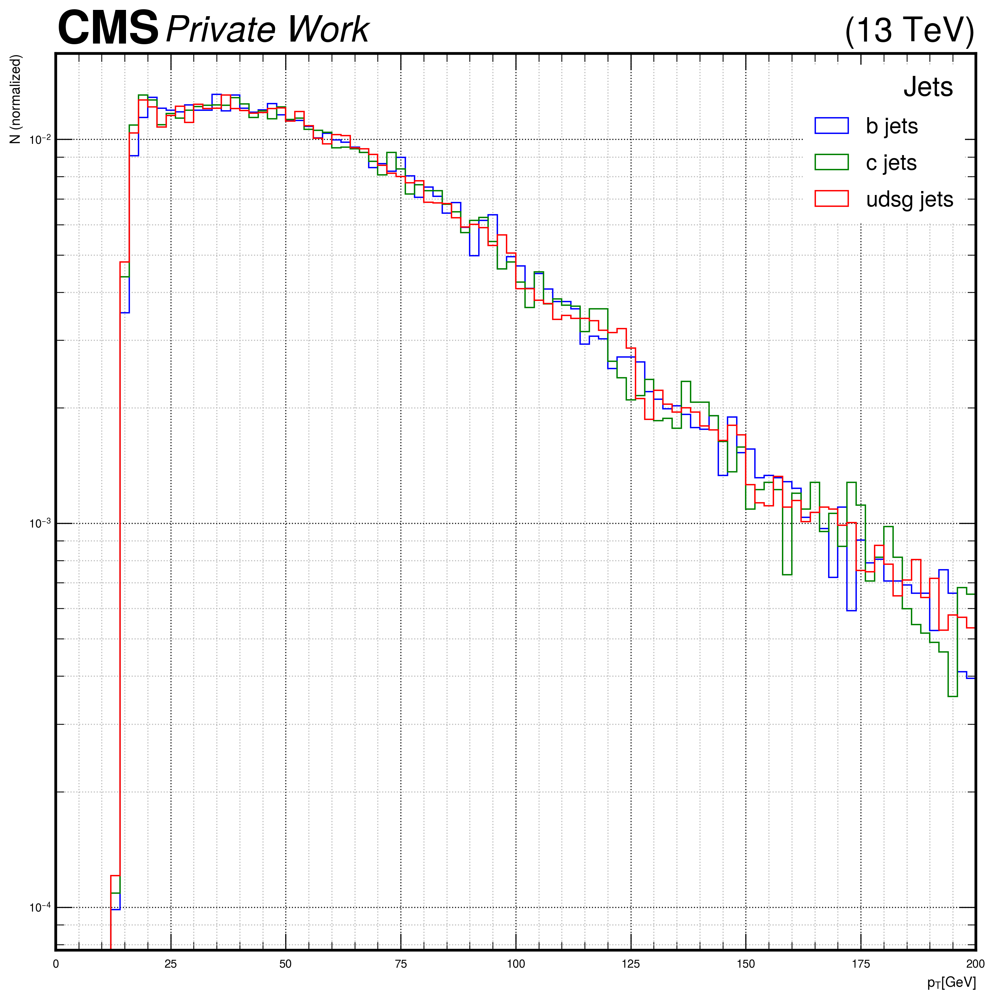

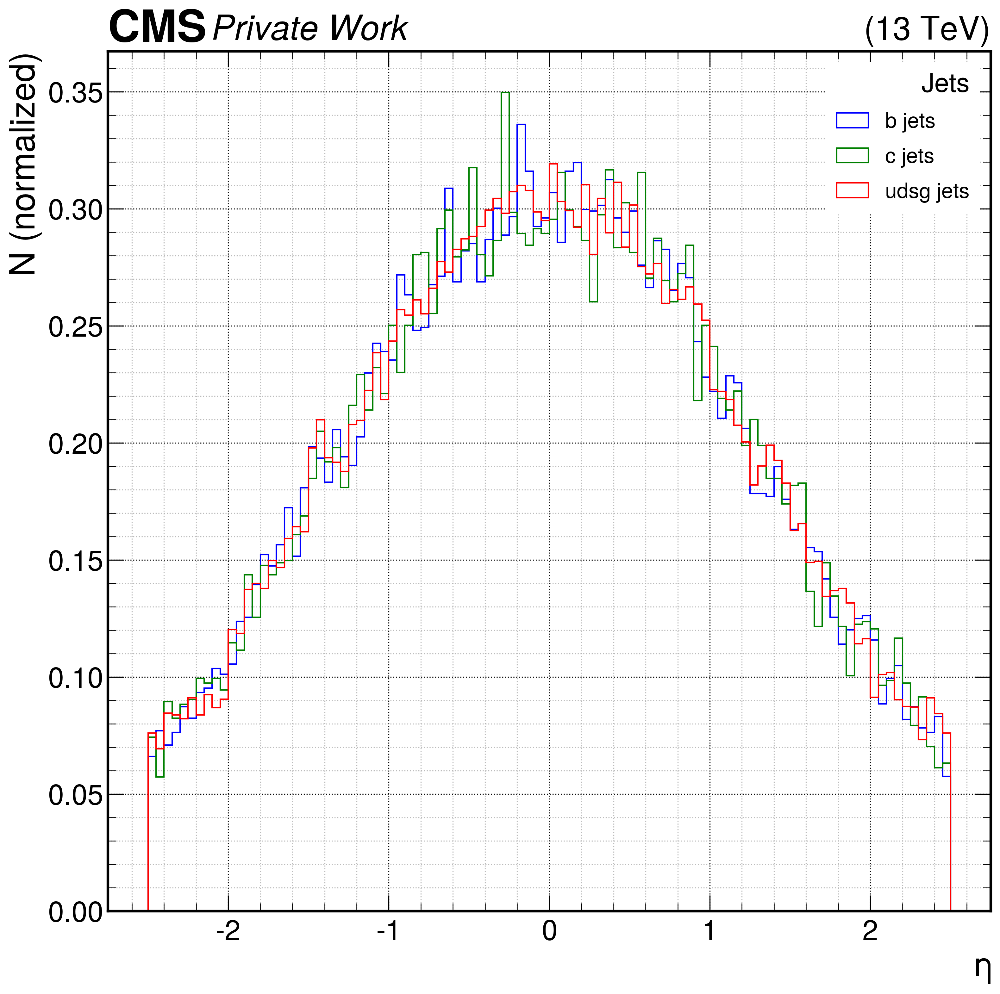

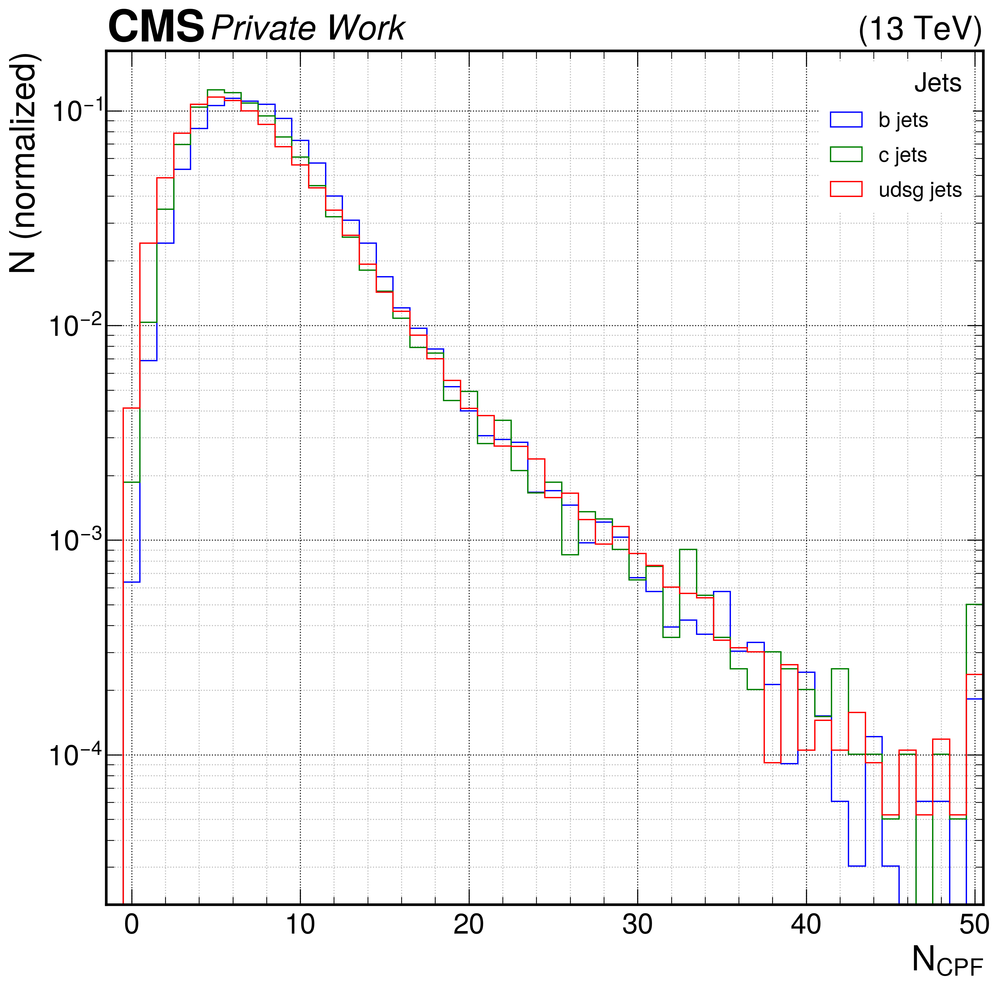

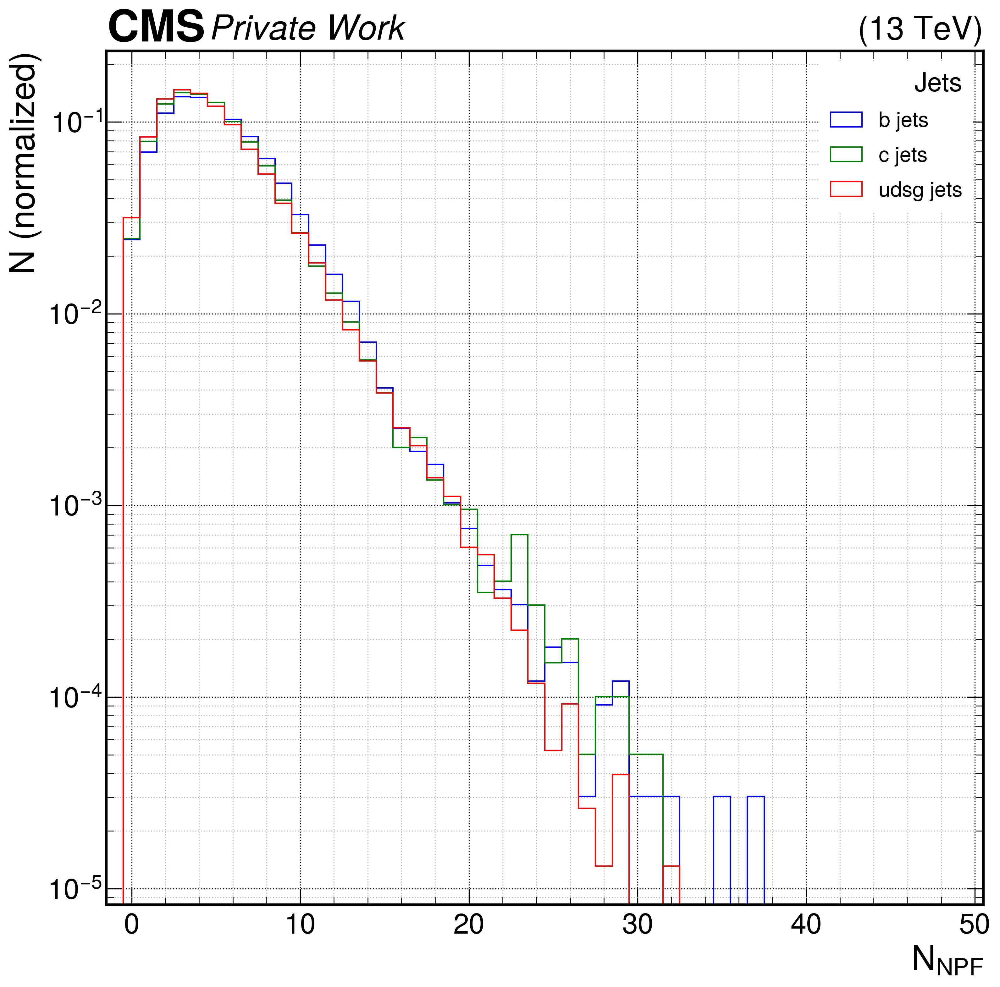

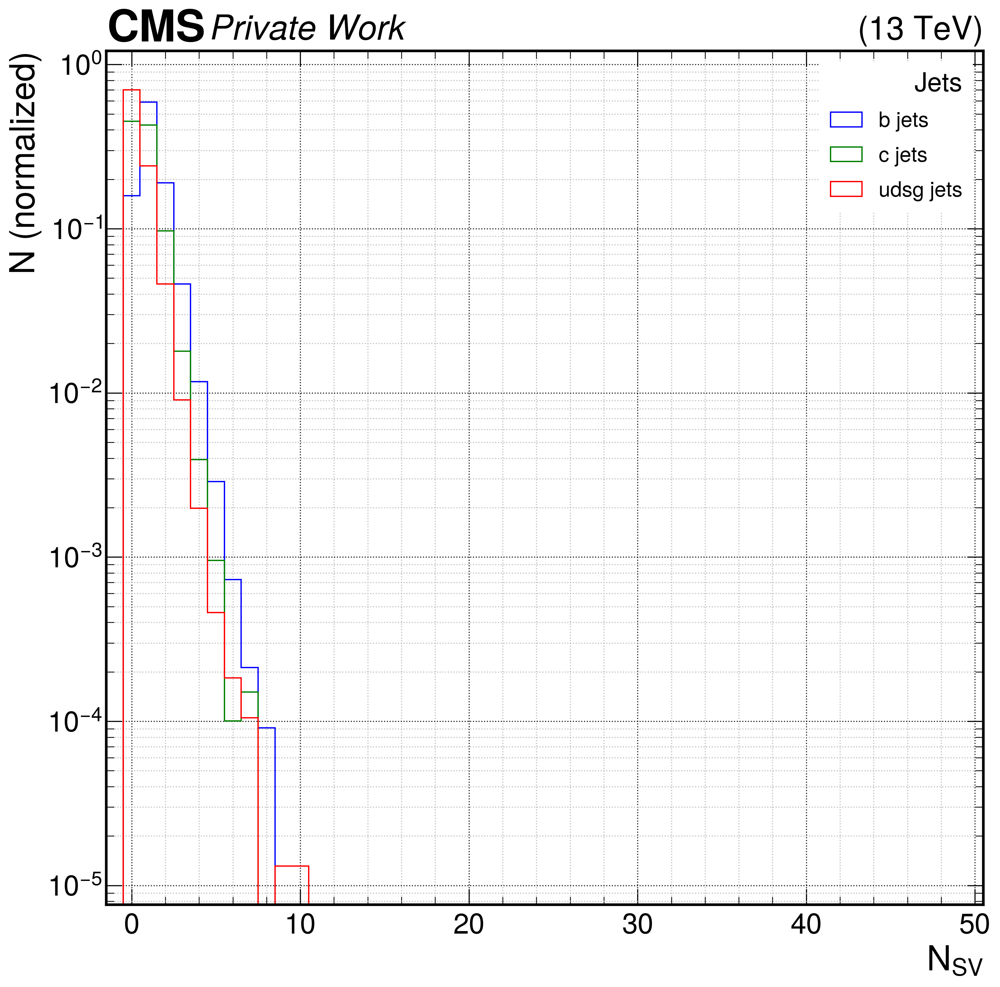

...

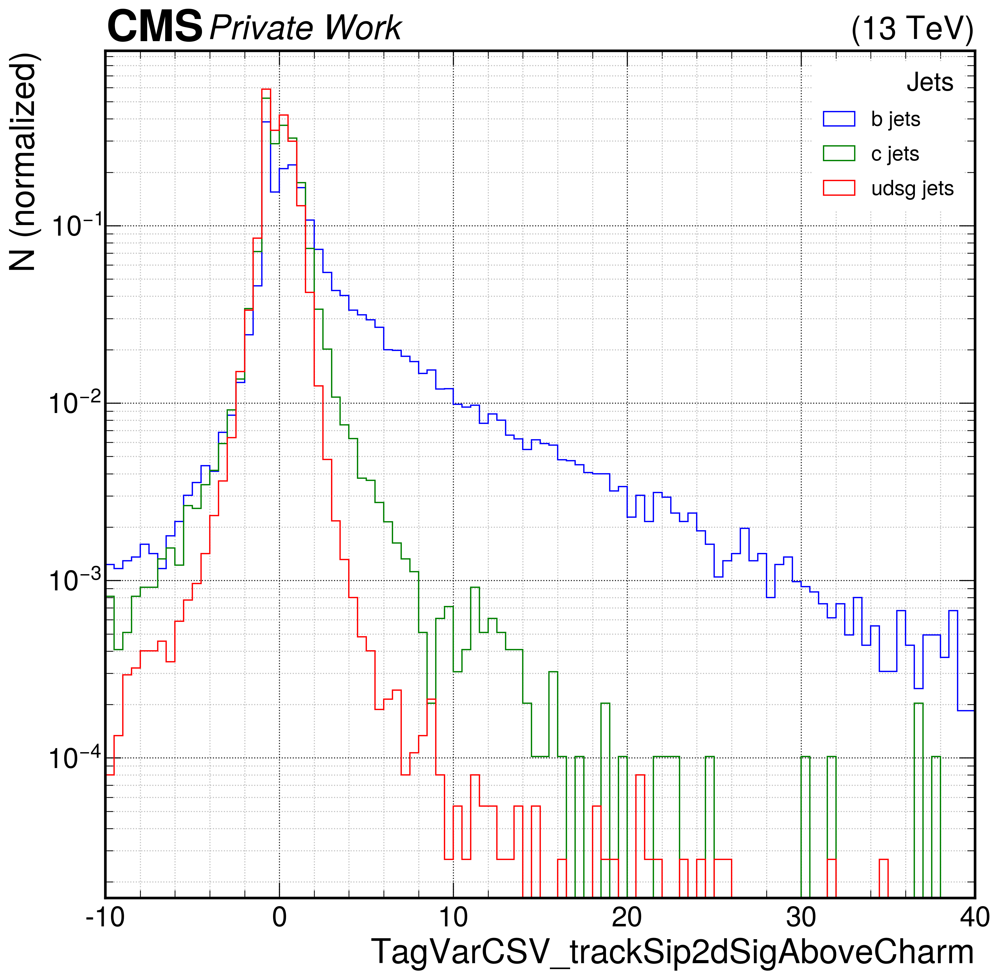

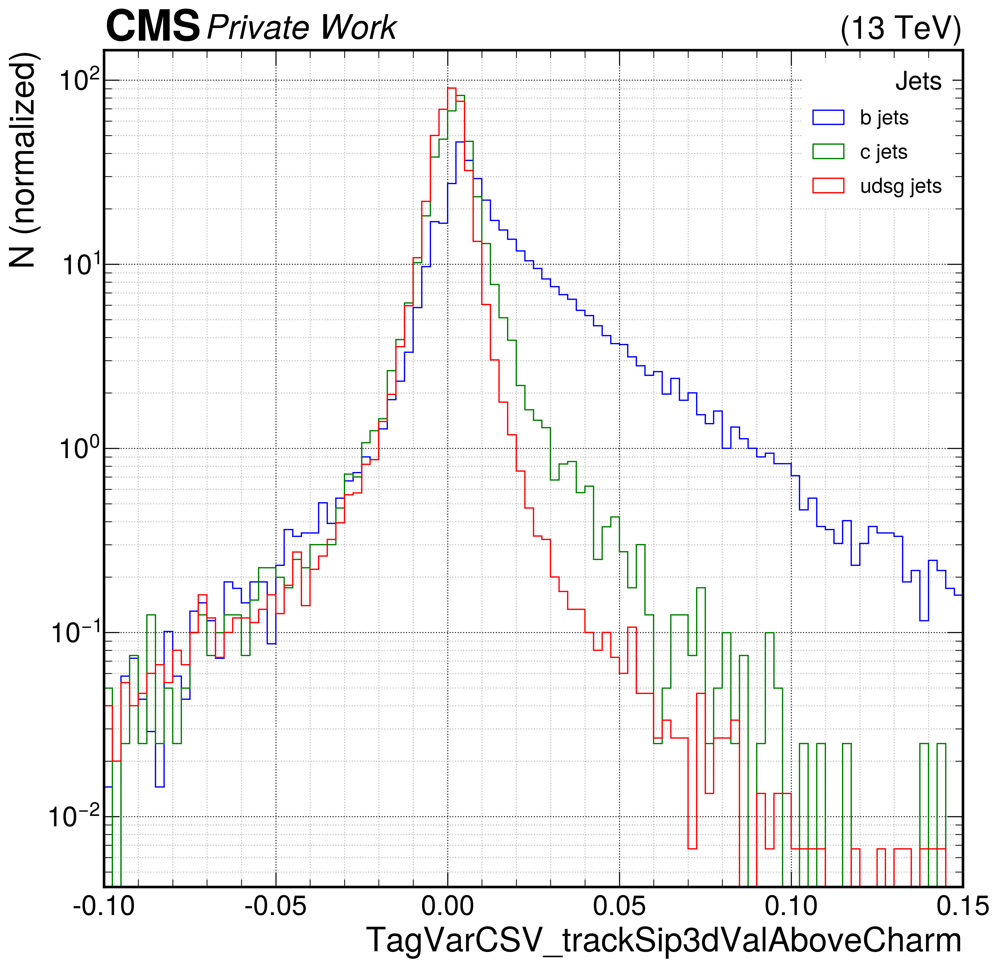

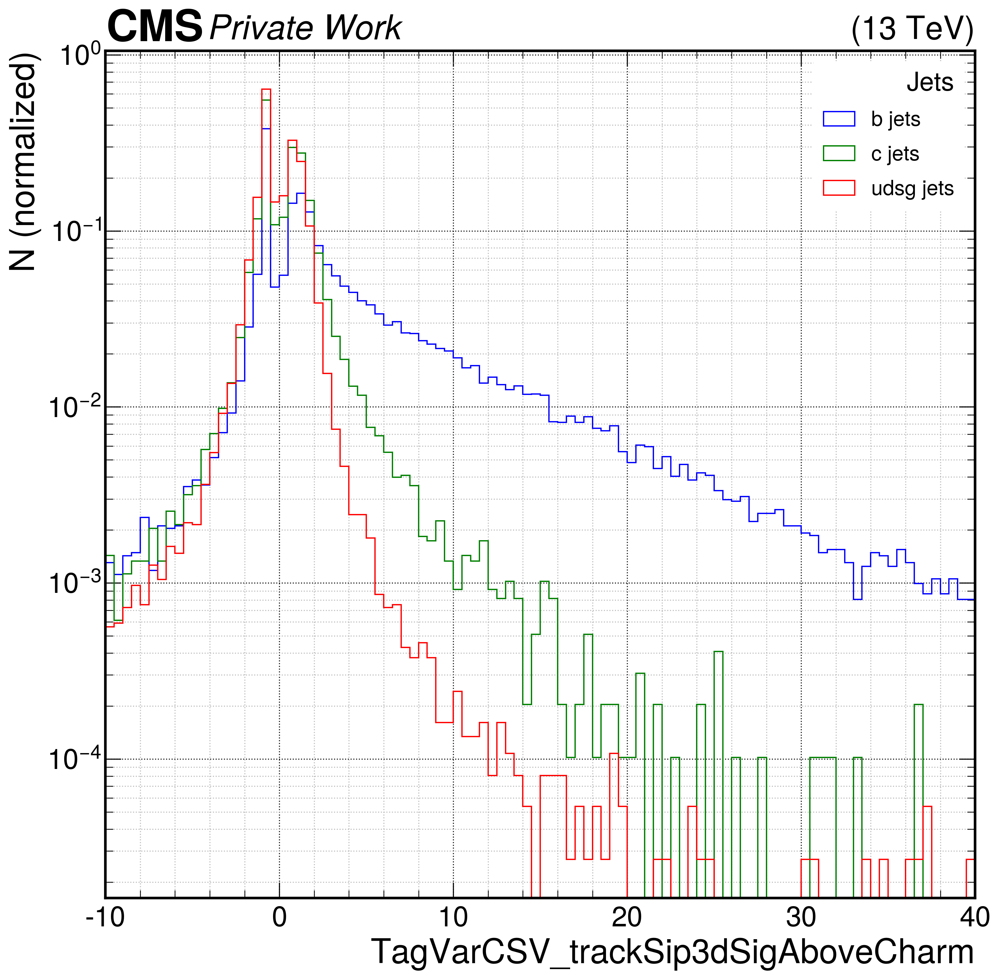

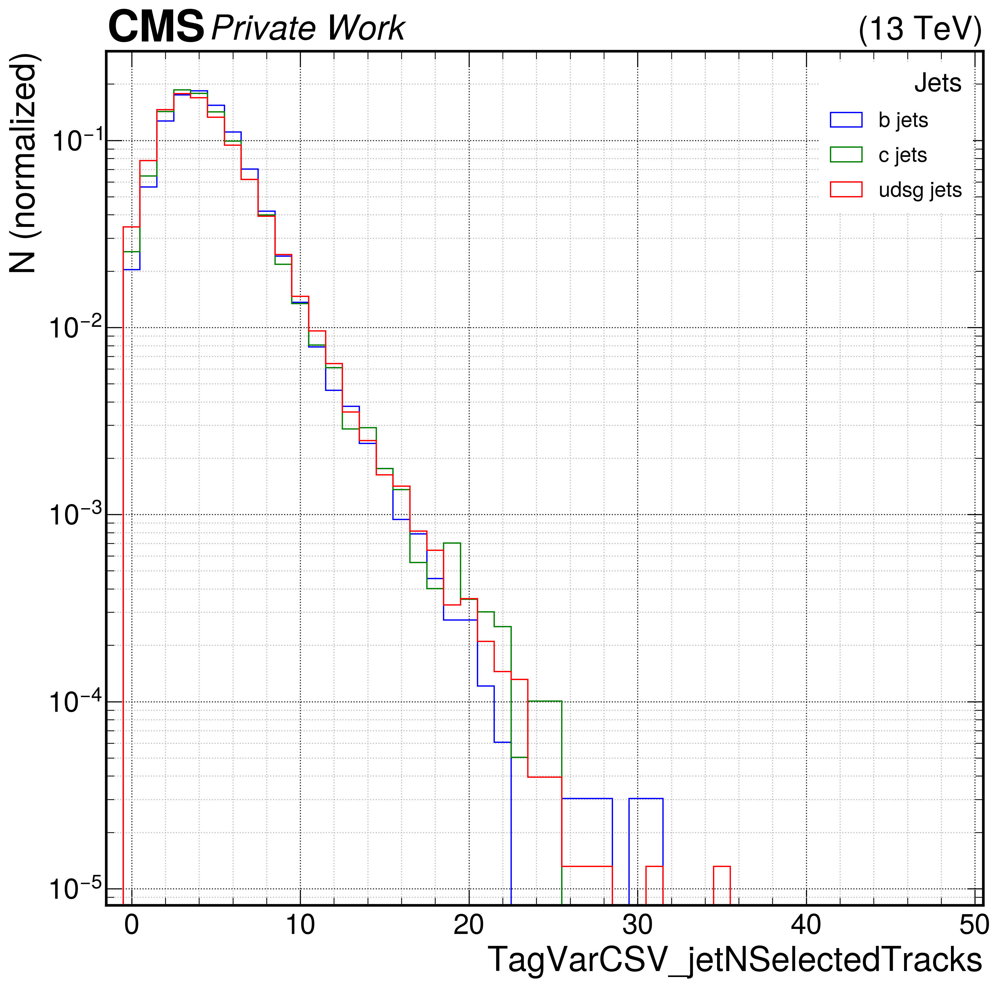

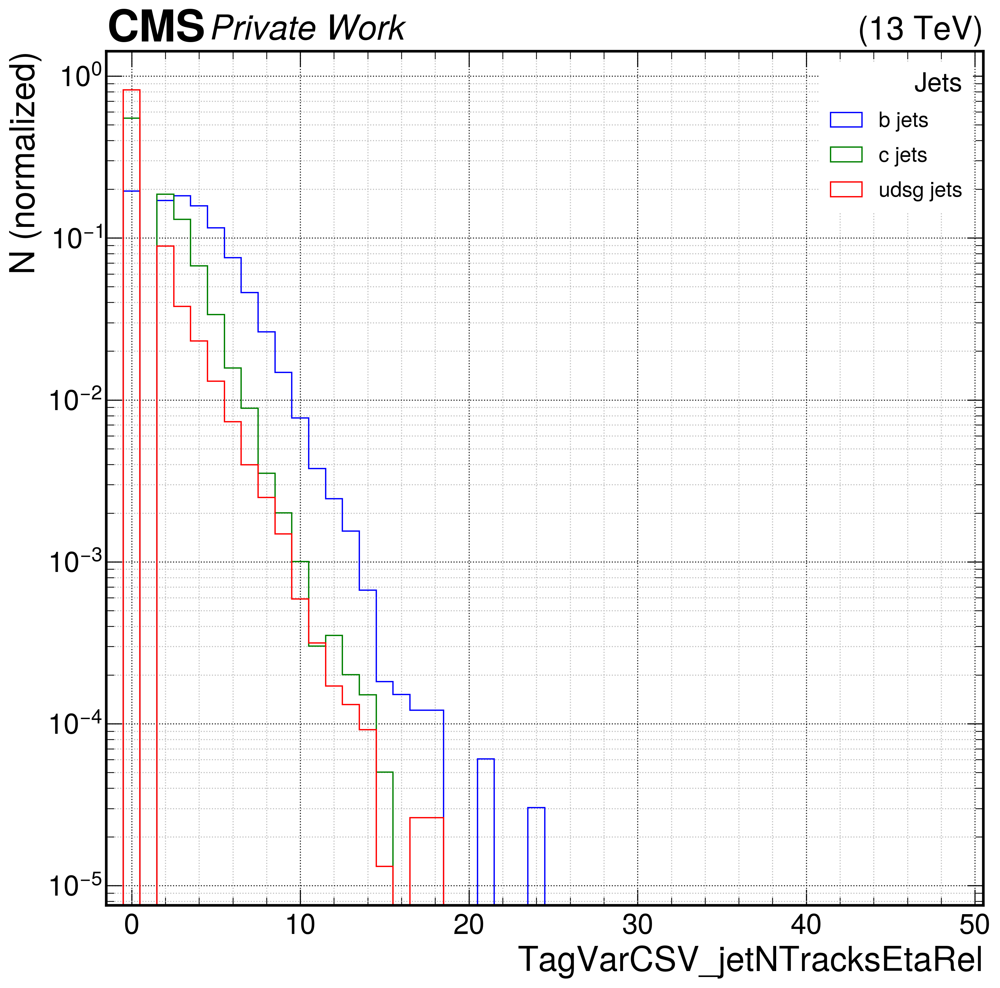

In [27]:
### Plot histograms of quantities
quantities = [
             'jet_pt','jet_eta', 'nCpfcand','nNpfcand', 'nsv','npv', 'TagVarCSV_trackSumJetEtRatio', 'TagVarCSV_trackSumJetDeltaR', 'TagVarCSV_vertexCategory', 'TagVarCSV_trackSip2dValAboveCharm', 'TagVarCSV_trackSip2dSigAboveCharm', 'TagVarCSV_trackSip3dValAboveCharm', 'TagVarCSV_trackSip3dSigAboveCharm', 'TagVarCSV_jetNSelectedTracks', 'TagVarCSV_jetNTracksEtaRel',
             #'Cpfcan_BtagPf_trackEtaRel', 'Cpfcan_BtagPf_trackPtRel', 'Cpfcan_BtagPf_trackPPar', 'Cpfcan_BtagPf_trackDeltaR', 'Cpfcan_BtagPf_trackPParRatio', 'Cpfcan_BtagPf_trackSip2dVal', 'Cpfcan_BtagPf_trackSip2dSig', 'Cpfcan_BtagPf_trackSip3dVal', 'Cpfcan_BtagPf_trackSip3dSig', 'Cpfcan_BtagPf_trackJetDistVal', 'Cpfcan_ptrel', 'Cpfcan_drminsv', 'Cpfcan_VTX_ass', 'Cpfcan_puppiw', 'Cpfcan_chi2', 'Cpfcan_quality',
             #'Npfcan_ptrel', 'Npfcan_deltaR', 'Npfcan_isGamma', 'Npfcan_HadFrac', 'Npfcan_drminsv', 'Npfcan_puppiw',
             #'sv_pt','sv_deltaR', 'sv_mass', 'sv_ntracks', 'sv_chi2', 'sv_normchi2', 'sv_dxy', 'sv_dxysig', 'sv_d3d', 'sv_d3dsig', 'sv_costhetasvpv', 'sv_enratio'
]
# normalize histograms for all flavours
normalize_by_flavour = True
# choose variables, that should be plotted linearly
plot_linear = ['jet_eta','Cpfcan_puppiw','Npfcan_isGamma']
# specify binning: [left edge, right edge, Nbins]
quantity_binnings = {
    # global
    'jet_pt': [0,200,100], 
    'jet_eta': [-2.75,2.75,110],
    'nCpfcand': [-1.5,50.5,52],
    'nNpfcand': [-1.5,50.5,52],
    'nsv': [-1.5,50.5,52],
    'npv': [-1.5,100.5,102],
    'TagVarCSV_trackSumJetEtRatio': [-0.25,2.25,100],
    'TagVarCSV_trackSumJetDeltaR': [-0.05,0.2,100],
    'TagVarCSV_vertexCategory': [-1.5,5.5,7],
    'TagVarCSV_trackSip2dValAboveCharm': [-0.1,0.15,100],
    'TagVarCSV_trackSip2dSigAboveCharm': [-10,40,100],
    'TagVarCSV_trackSip3dValAboveCharm': [-0.1,0.15,100],
    'TagVarCSV_trackSip3dSigAboveCharm': [-10,40,100],
    'TagVarCSV_jetNSelectedTracks': [-1.5,50.5,52],
    'TagVarCSV_jetNTracksEtaRel': [-1.5,50.5,52],
    # cpf
    'Cpfcan_BtagPf_trackEtaRel': [-2.5,7.5,100],
    'Cpfcan_BtagPf_trackPtRel': [-0.5,4.5,100],
    'Cpfcan_BtagPf_trackPPar': [-5,95,100],
    'Cpfcan_BtagPf_trackDeltaR': [-0.025,0.475,100],
    'Cpfcan_BtagPf_trackPParRatio': [-1.25,1.25,100],
    'Cpfcan_BtagPf_trackSip2dVal': [-2.5,10,100],
    'Cpfcan_BtagPf_trackSip2dSig': [-5,45,100],
    'Cpfcan_BtagPf_trackSip3dVal': [-2.5,10,100],
    'Cpfcan_BtagPf_trackSip3dSig': [-5,45,100],
    'Cpfcan_BtagPf_trackJetDistVal': [-2,0.5,100],
    'Cpfcan_ptrel': [-1.1,0.1,120],
    'Cpfcan_drminsv': [-0.45,0.05,100],
    'Cpfcan_VTX_ass': [-1.5,8.5,10],
    'Cpfcan_puppiw': [-1.5,2.5,4],
    'Cpfcan_chi2': [-1.5,10.5,12],
    'Cpfcan_quality': [-1.5,6.5,8],
    # npf
    'Npfcan_ptrel': [-1.1,0.4,150], 
    'Npfcan_deltaR': [-0.75,0.25,100],
    'Npfcan_isGamma': [-1.5,2.5,4], 
    'Npfcan_HadFrac': [-0.1,1.4,150], 
    'Npfcan_drminsv': [-0.45,0.05,100], 
    'Npfcan_puppiw': [-0.1,1.1,120],
    # vtx
    'sv_pt': [-5,105,110],
    'sv_deltaR': [-0.75,0.25,100],
    'sv_mass': [-1,11,120],
    'sv_ntracks': [-1.5,20.5,22],
    'sv_chi2': [-2,23,100],
    'sv_normchi2': [-5,20,100],
    'sv_dxy': [-2,23,100],
    'sv_dxysig': [-20,230,100],
    'sv_d3d': [-2,23,100],
    'sv_d3dsig': [-20,230,100],
    'sv_costhetasvpv': [-1.1,1.1,110],
    'sv_enratio': [-0.2,2.3,100],
}

for quantity in quantities:
    quantity_array = get_array(quantity)
    binning = quantity_binnings[quantity]
    no_defaults = np.logical_and(np.logical_and((quantity_array!=-999),(quantity_array!=-1)),(quantity_array!=0))
    print('{}: minimum {:n} , maximum {:n}'.format(quantity,np.min(quantity_array[no_defaults]),np.max(quantity_array[no_defaults])))
    print('    -999: {:n} , -1: {:n} , 0:{:n}'.format(len(np.where(quantity_array==-999)[0]),len(np.where(quantity_array==-1)[0]),len(np.where(quantity_array==0)[0])))
    print('    10%: {:n} , 90%: {:n}'.format(np.quantile(quantity_array,0.1),np.quantile(quantity_array,0.9)))
    # make figure
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    plt.style.use(hep.cms.style.ROOT)
    ax.set_xlim(left=binning[0], right=binning[1])
    if quantity in plot_linear:
        ax.set_yscale('linear')
    else:
        ax.set_yscale('log')
    if normalize_by_flavour:
        ax.set_ylabel('N (normalized)')
    else:
        ax.set_ylabel('N')
    ax.set_xlabel(quantity_labels[quantity])
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    if normalize_by_flavour:
        ax.hist(quantity_array[B==1], density=True, bins=binning[2], range=(binning[0],binning[1]), label='b jets', color='blue', histtype='step')
        ax.hist(quantity_array[C==1], density=True, bins=binning[2], range=(binning[0],binning[1]), label='c jets', color='green', histtype='step')
        ax.hist(quantity_array[L==1], density=True, bins=binning[2], range=(binning[0],binning[1]), label='udsg jets', color='red', histtype='step') 
    else:
        ax.hist(quantity_array[B==1], bins=binning[2], range=(binning[0],binning[1]), label='b jets: {:n}'.format(np.sum(B)), color='blue', histtype='step')
        ax.hist(quantity_array[C==1], bins=binning[2], range=(binning[0],binning[1]), label='c jets: {:n}'.format(np.sum(C)), color='green', histtype='step')
        ax.hist(quantity_array[L==1], bins=binning[2], range=(binning[0],binning[1]), label='udsg jets: {:n}'.format(np.sum(L)), color='red', histtype='step')
    if np.mean(quantity_array[quantity_array<binning[1]])>(binning[0]+binning[1])/2:
        legloc = 'upper left'
    else:
        legloc = 'upper right'
    if normalize_by_flavour:
        ax.set_ylabel('N (normalized)')
        leg=ax.legend(title='Jets', fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    else:
        ax.set_ylabel('N')
        leg=ax.legend(title='Total jets: {}'.format(len(isB)), fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/{}.pdf'.format(saveDir,quantity))

<ipython-input-18-c4f05255fd28>:3: RuntimeWarning: invalid value encountered in true_divide
  return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])
<ipython-input-18-c4f05255fd28>:3: RuntimeWarning: divide by zero encountered in log
  return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])
<ipython-input-18-c4f05255fd28>:3: RuntimeWarning: invalid value encountered in multiply
  return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])
<ipython-input-18-c4f05255fd28>:3: RuntimeWarning: invalid value encountered in true_divide
  return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])
<ipython-input-18-c4f05255fd28>:3: RuntimeWarning: divide by zero encountered in log
  return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])
<ipython-input-18-c4f05255fd28>:3: RuntimeWarning: invalid value encountered in multiply
  return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])
<ipython-input-18-c4f05255fd28>:3: RuntimeWarning: invalid value encountered i

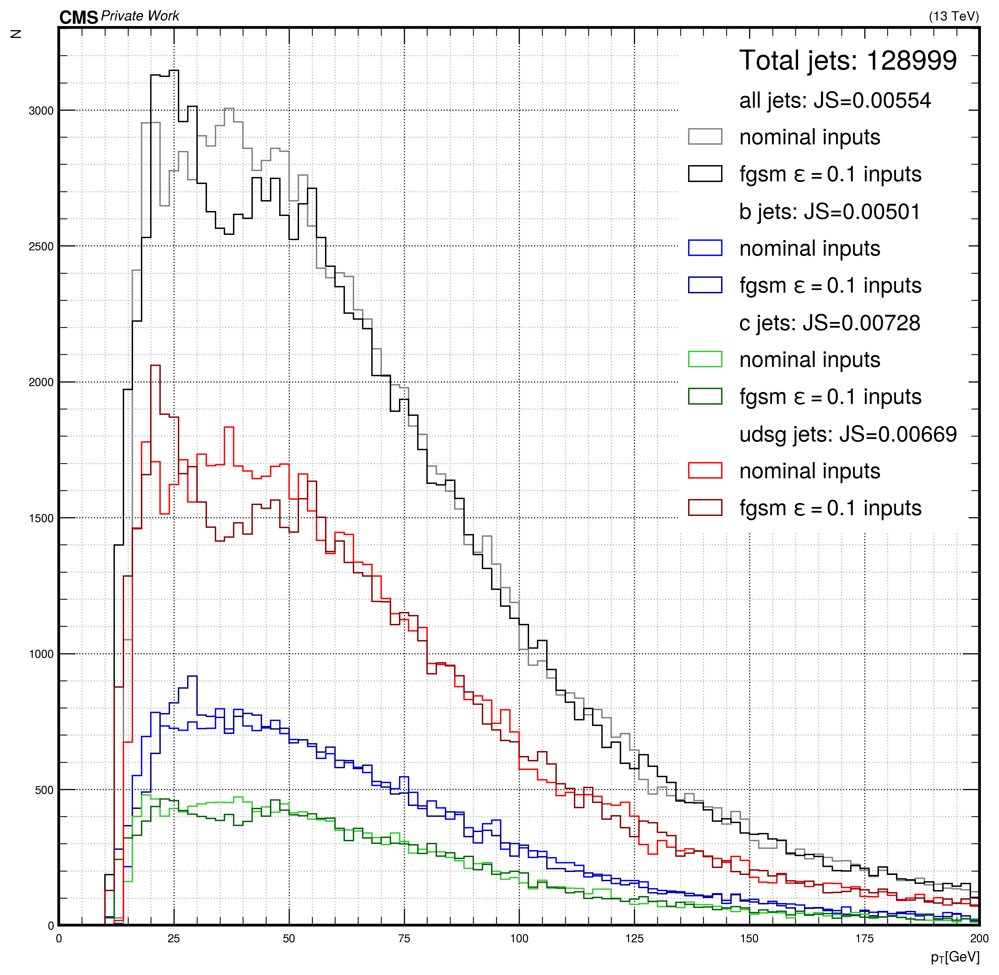

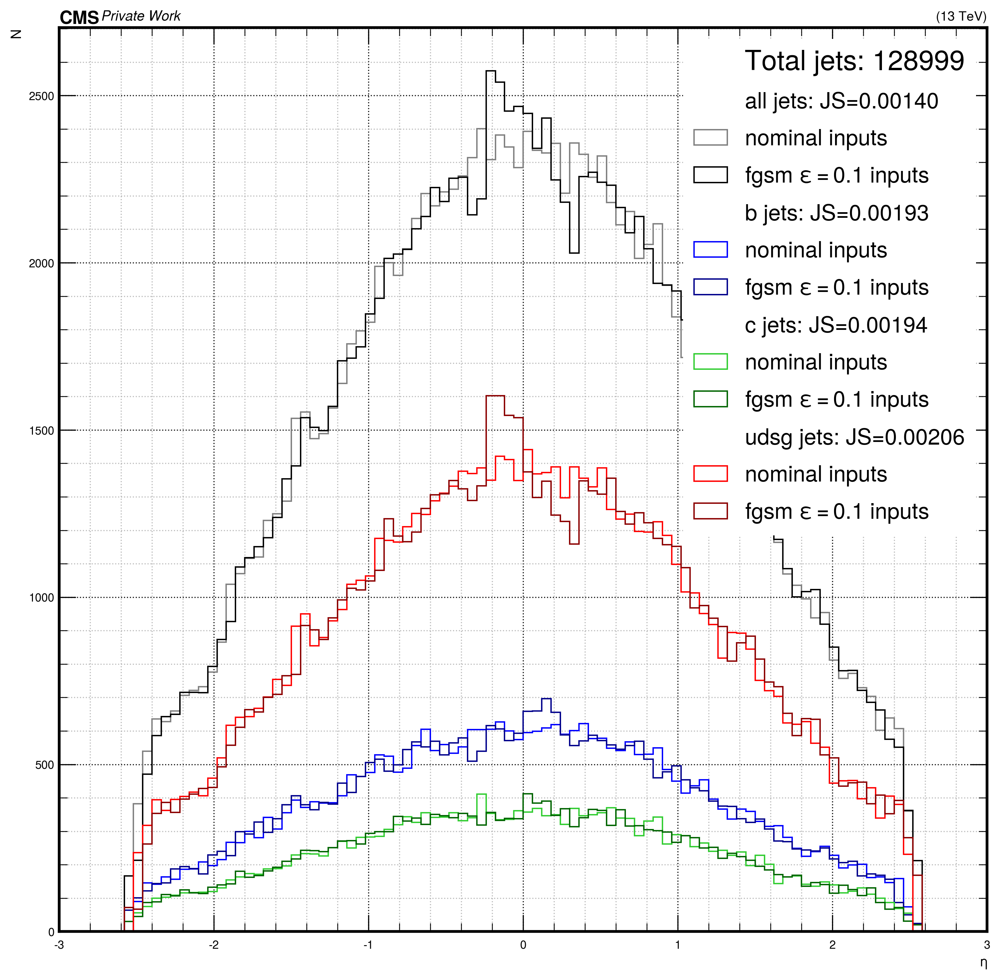

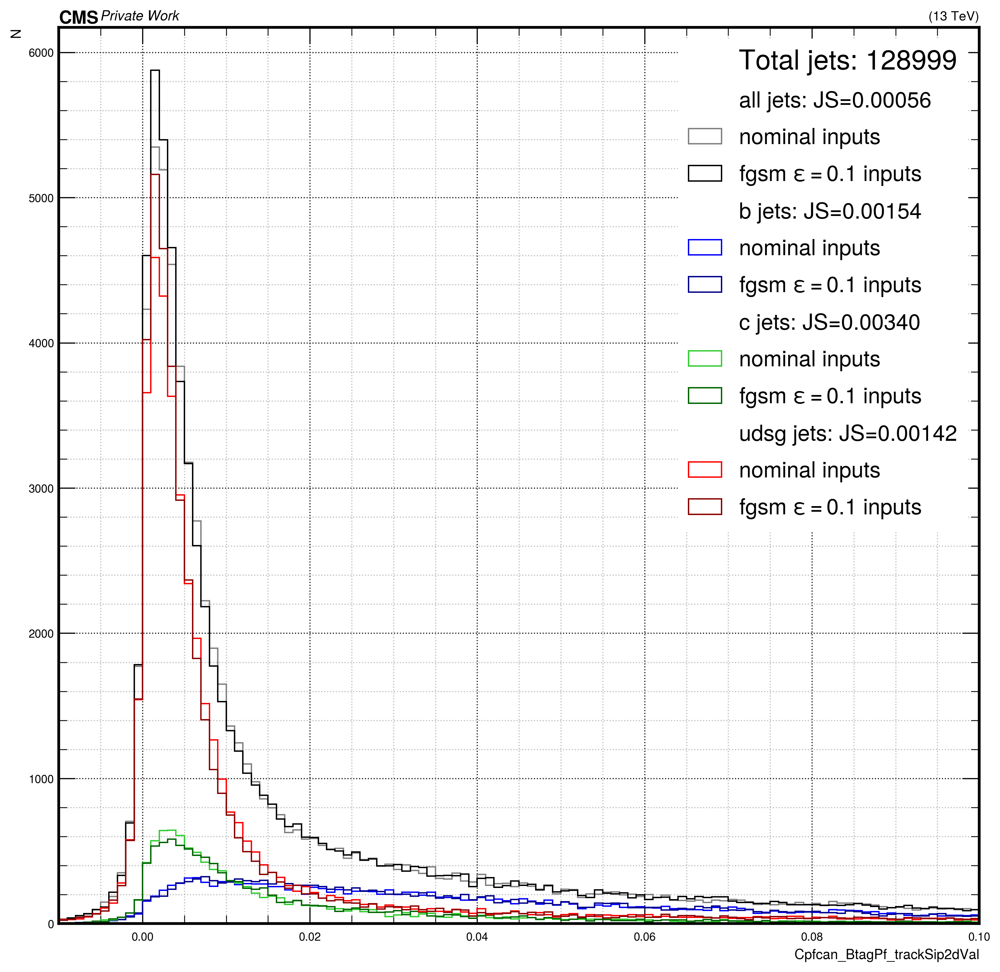

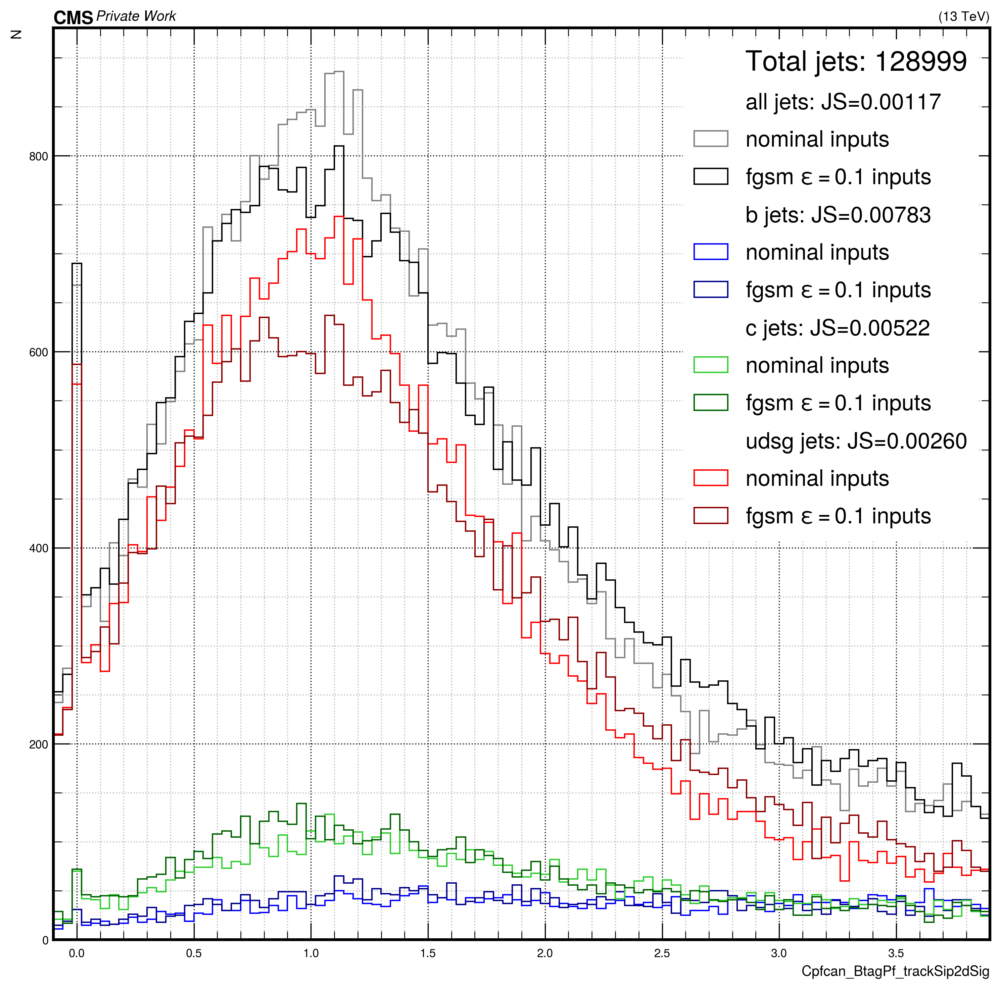

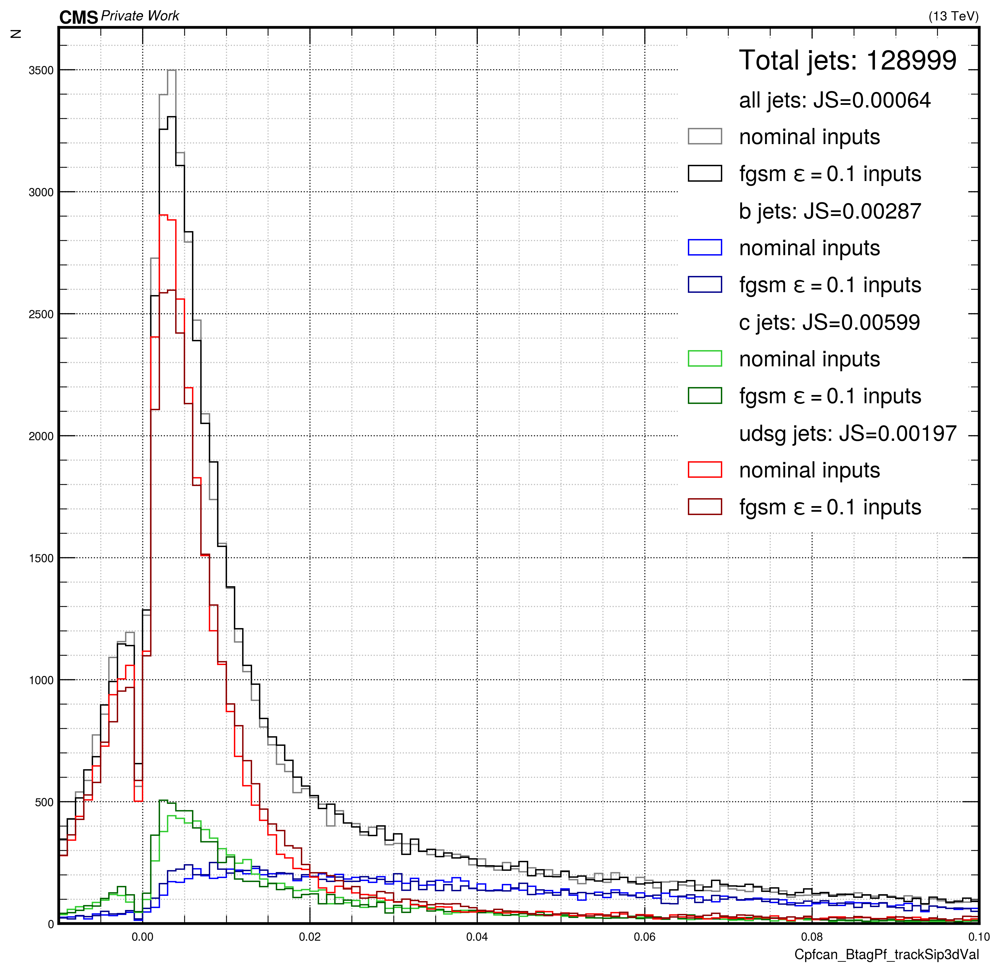

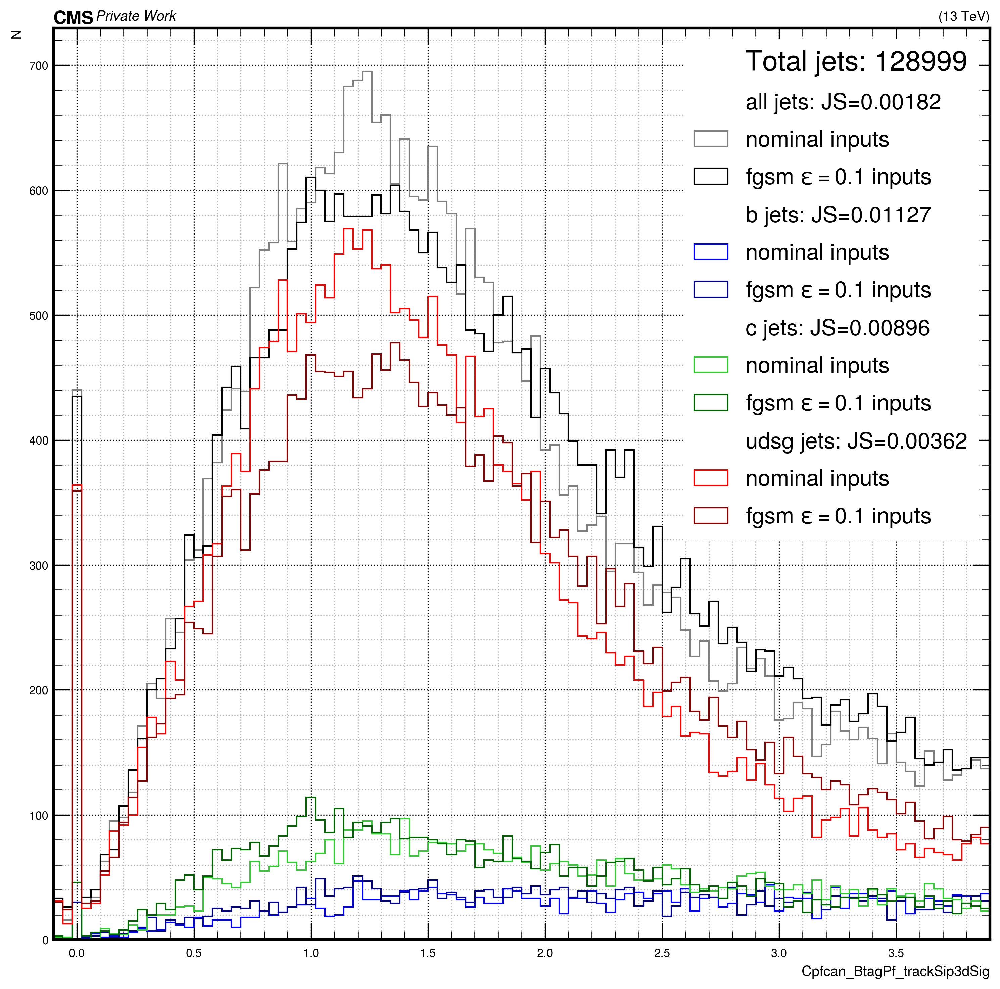

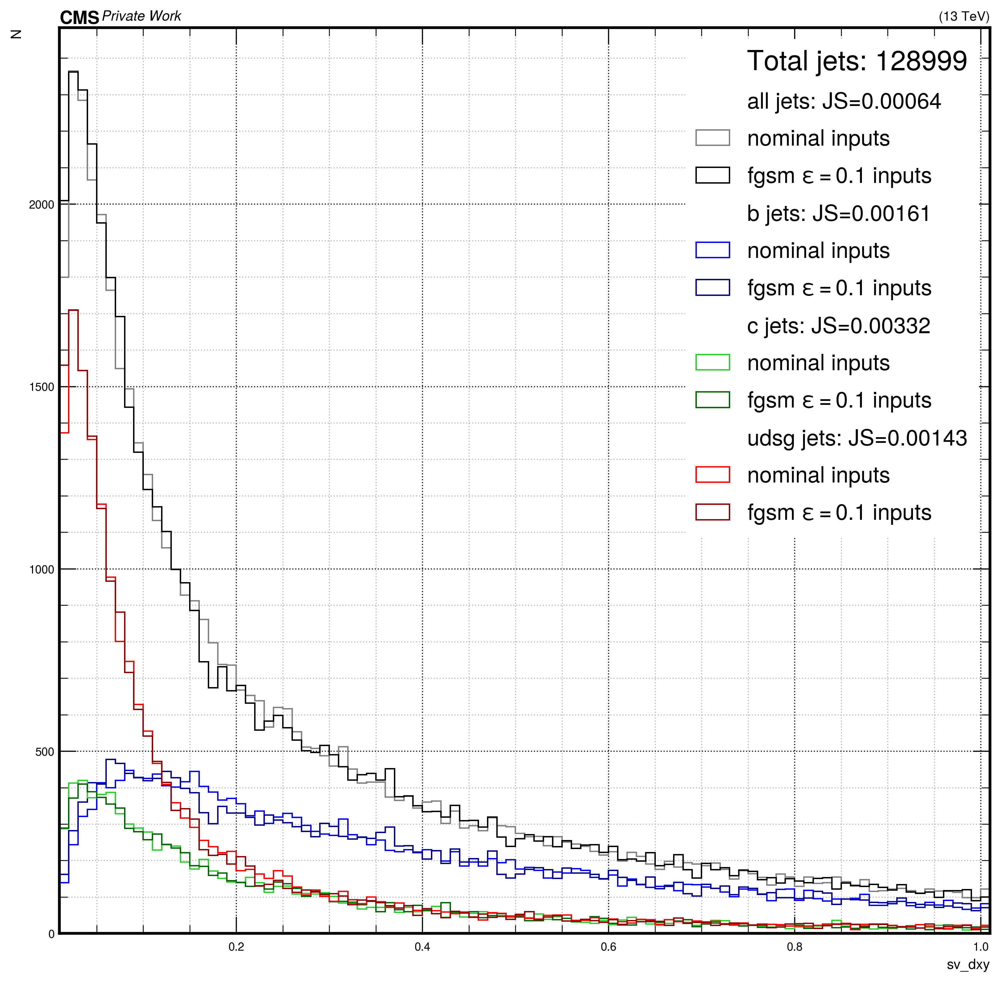

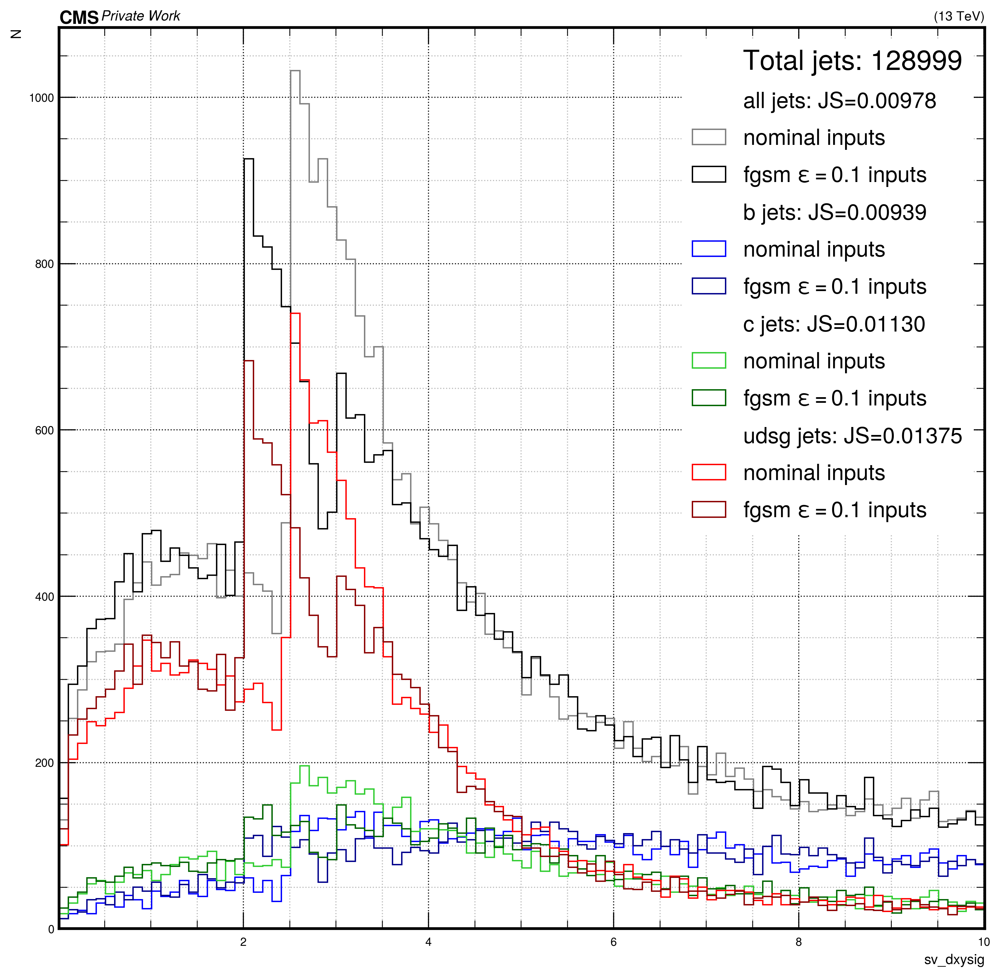

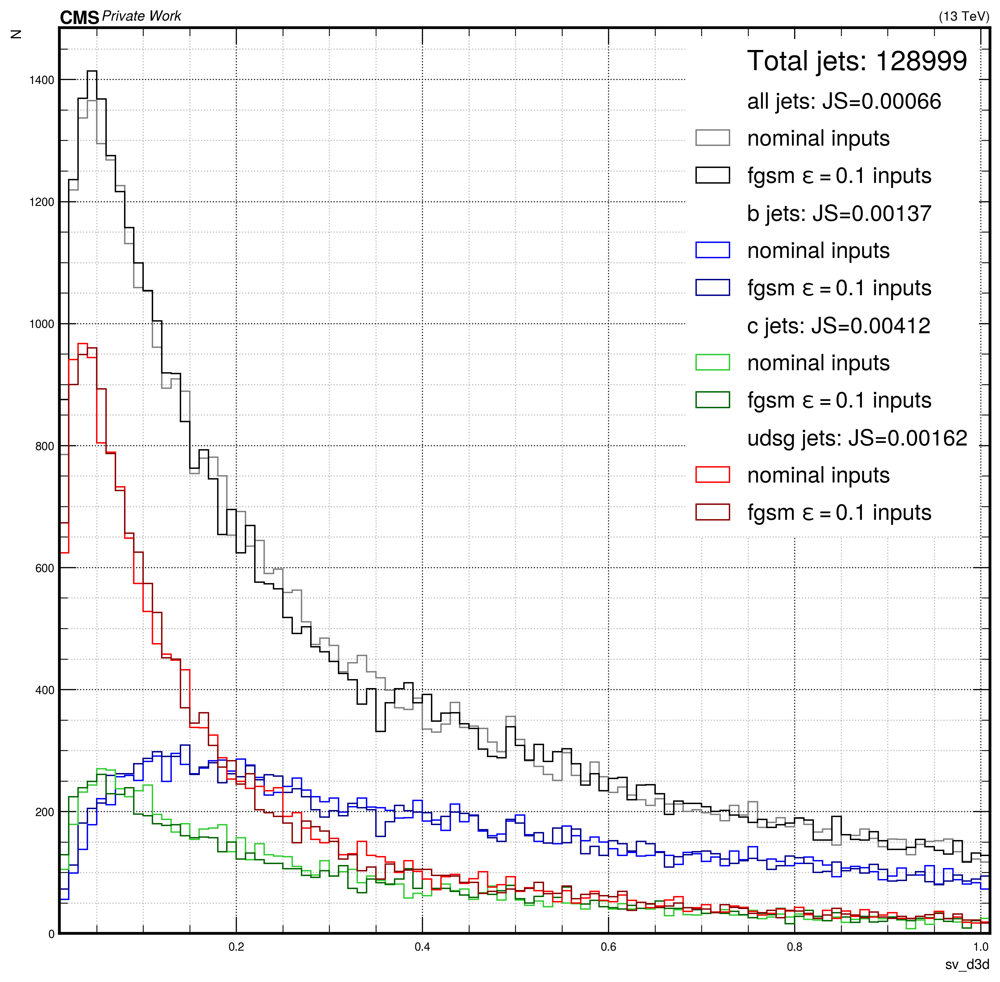

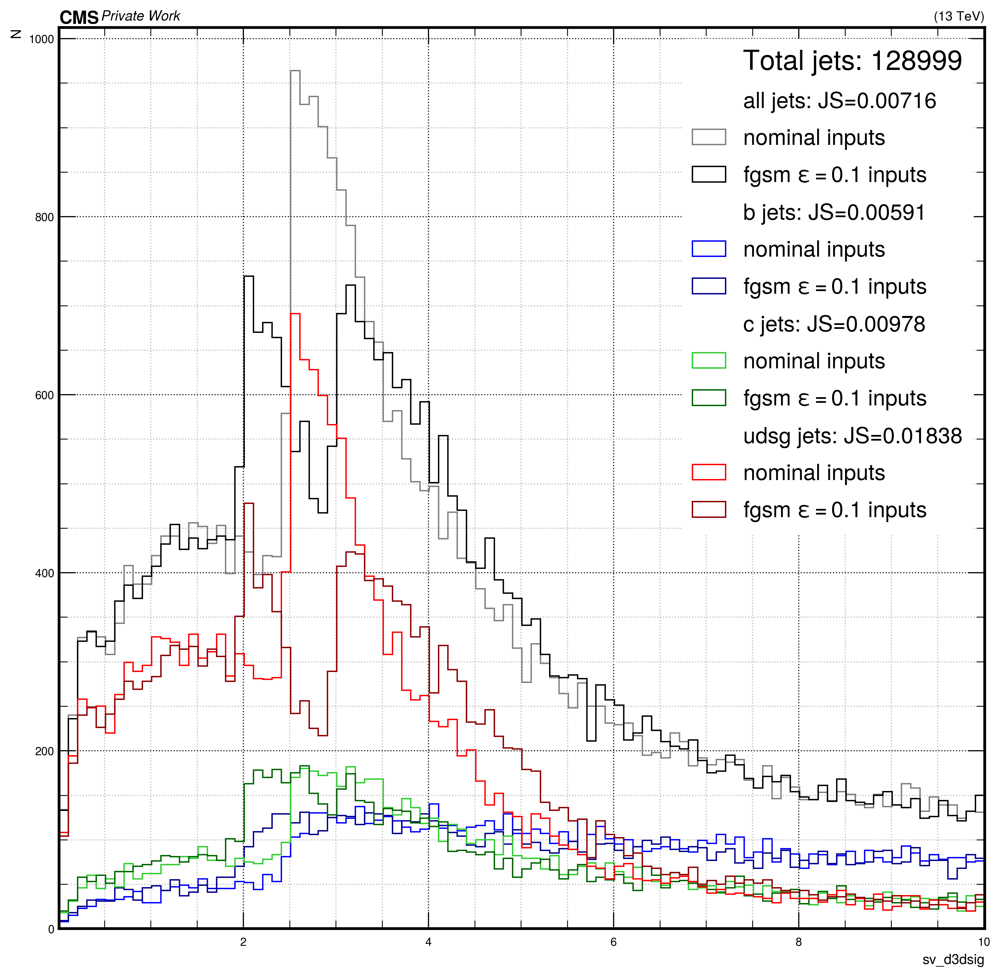

In [20]:
### Plot nominal and adversarial inputs
# list of quantities to plot
quantities = ['jet_pt','jet_eta','Cpfcan_BtagPf_trackSip2dVal','Cpfcan_BtagPf_trackSip2dSig','Cpfcan_BtagPf_trackSip3dVal','Cpfcan_BtagPf_trackSip3dSig','sv_dxy','sv_dxysig','sv_d3d','sv_d3dsig']
# specify attack
attack = 'fgsm-0_1'
# specify binning: [left edge, right edge, Nbins]
quantity_binnings = {
    'jet_pt': [0,200,100],
    'jet_eta': [-3,3,100],
    'Cpfcan_BtagPf_trackSip2dVal': [-0.01,0.1,110],
    'Cpfcan_BtagPf_trackSip2dSig': [-0.1,3.9,100],
    'Cpfcan_BtagPf_trackSip3dVal': [-0.01,0.1,110],
    'Cpfcan_BtagPf_trackSip3dSig': [-0.1,3.9,100],
    'sv_dxy': [0.01,1.01,100],
    'sv_dxysig': [0.01,10.01,100],
    'sv_d3d': [0.01,1.01,100],
    'sv_d3dsig': [0.01,10.01,100],
}
# specify selections
selections = ['all','b','c','udsg']
selection_indices = {
    'all':B+C+L==1,
    'b':B==1,
    'c':C==1,
    'udsg':L==1,
}
selection_colors = {
    'all': ['grey','black'],
    'b': ['blue','darkblue'],
    'c': ['limegreen','darkgreen'],
    'udsg': ['red','darkred'],
}

for quantity in quantities:
    quantity_array1 = get_array(quantity, attack='nominal')
    quantity_array2 = get_array(quantity, attack=attack)
    binning = quantity_binnings[quantity]
    # compute the JS divergence values
    js_values = np.zeros(len(selections))
    for i,selection in enumerate(selections):
        counts = np.histogram(quantity_array1[selection_indices[selection]], bins=binning[2], range=(binning[0],binning[1]))[0]
        adv_counts = np.histogram(quantity_array2[selection_indices[selection]], bins=binning[2], range=(binning[0],binning[1]))[0]
        js_values[i] = jsdiv(counts, adv_counts, normalize_first=True)
    # make figure
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    ax.set_xlim(left=binning[0], right=binning[1])
    ax.set_ylabel('N')
    ax.set_xlabel(quantity_labels[quantity])
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    for i,selection in enumerate(selections):
        ax.hist([], linewidth=0, histtype='step', label='{} jets: JS={:.5f}'.format(selection,js_values[i]))
        ax.hist(quantity_array1[selection_indices[selection]], bins=binning[2], range=(binning[0],binning[1]), label='nominal inputs', color=selection_colors[selection][0], histtype='step')
        ax.hist(quantity_array2[selection_indices[selection]], bins=binning[2], range=(binning[0],binning[1]), label='{} inputs'.format(attack_labels[attack]), color=selection_colors[selection][1], histtype='step')
    legloc = 'upper right'
    leg=ax.legend(title='Total jets: {}'.format(len(isB)), fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/attacks/attack_hist-{}.pdf'.format(saveDir,quantity))
    

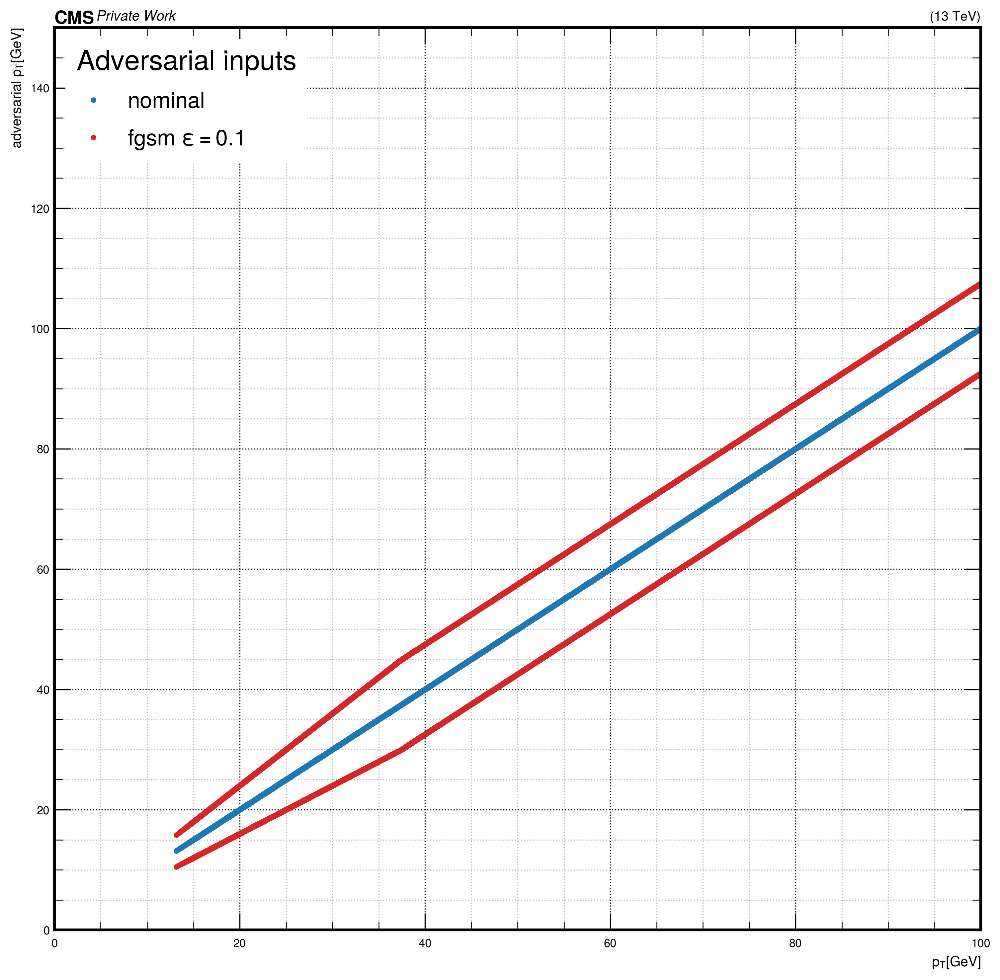

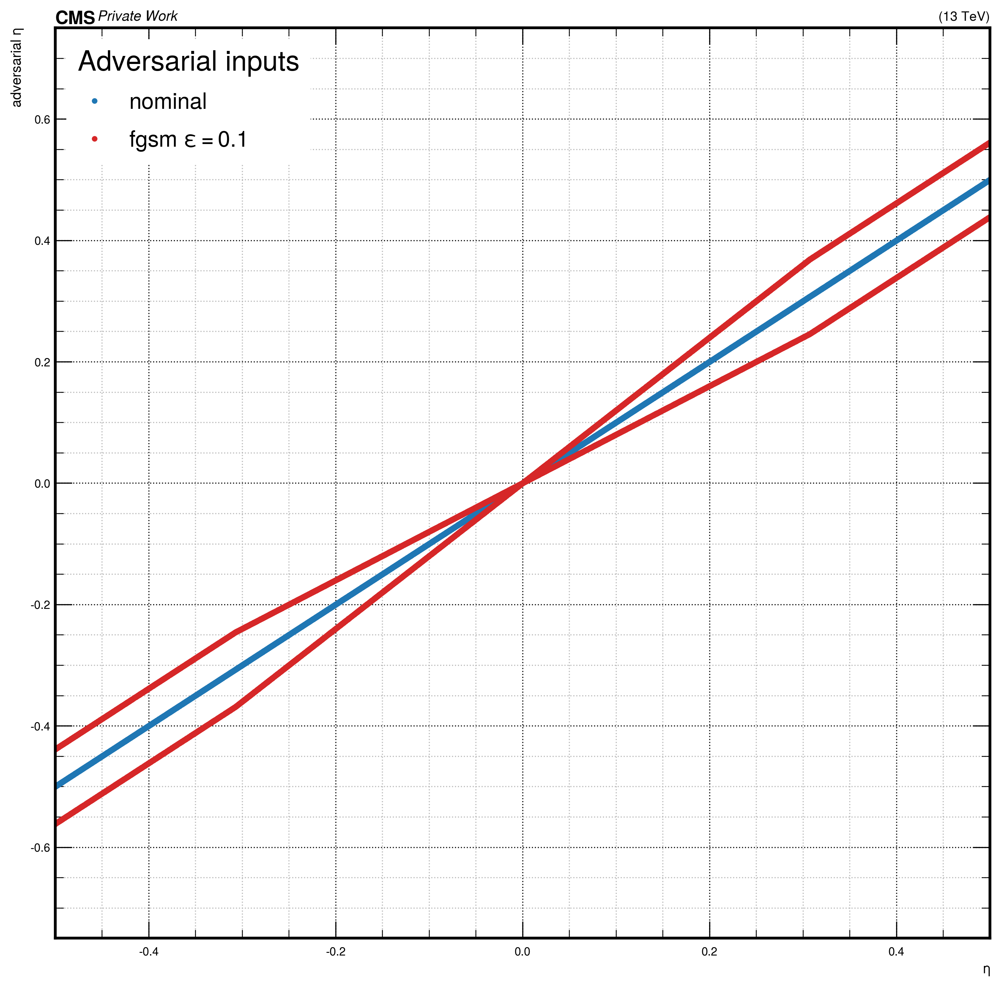

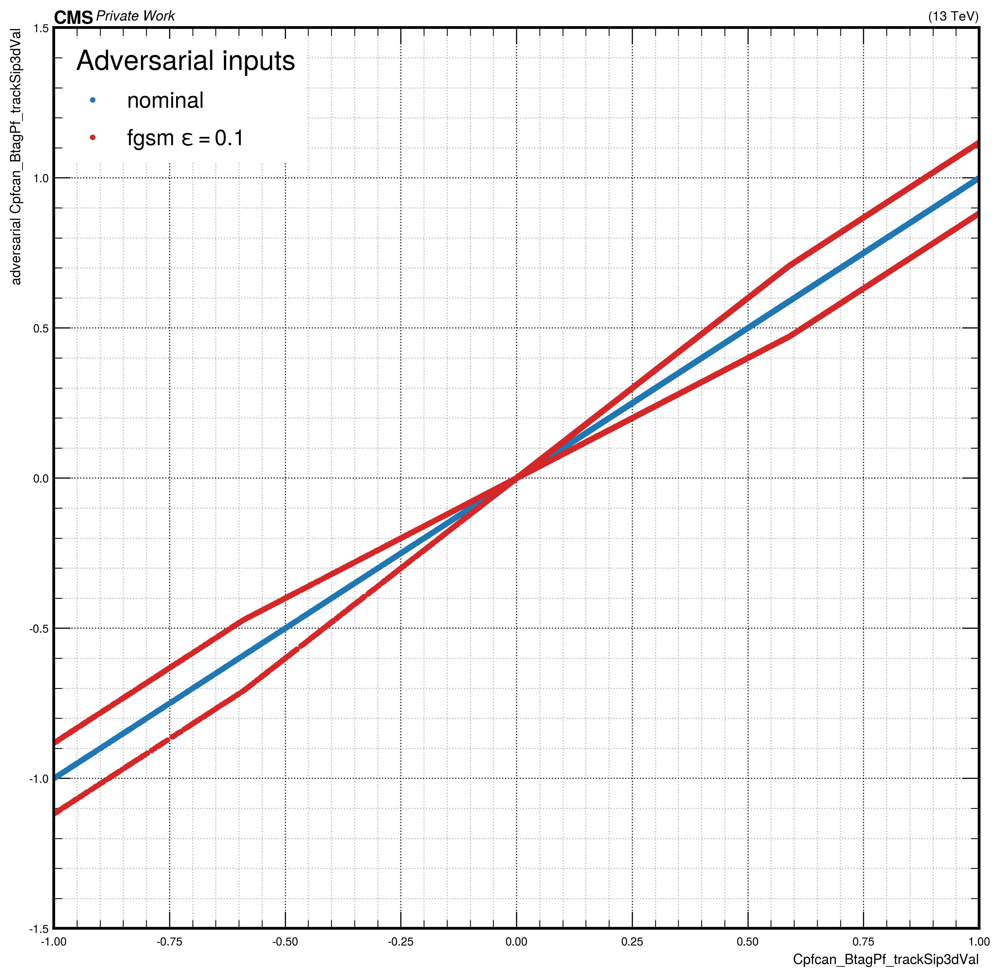

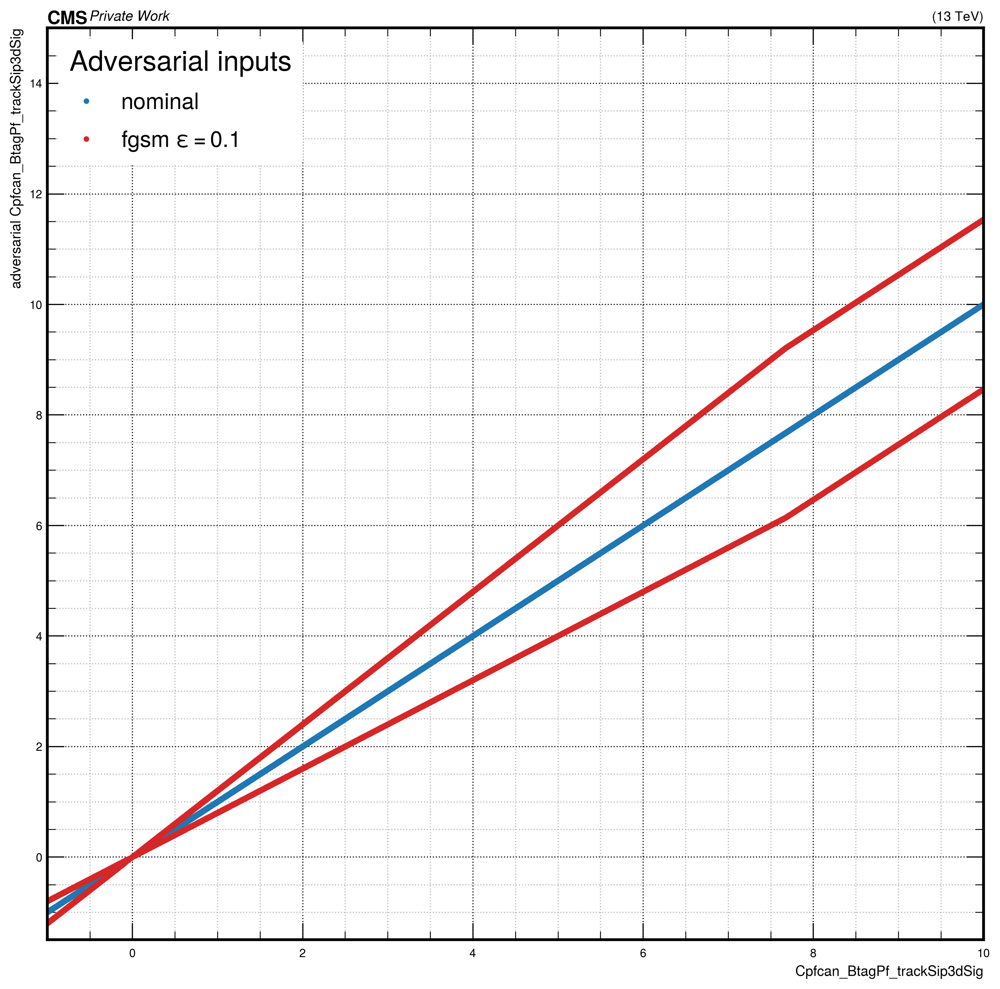

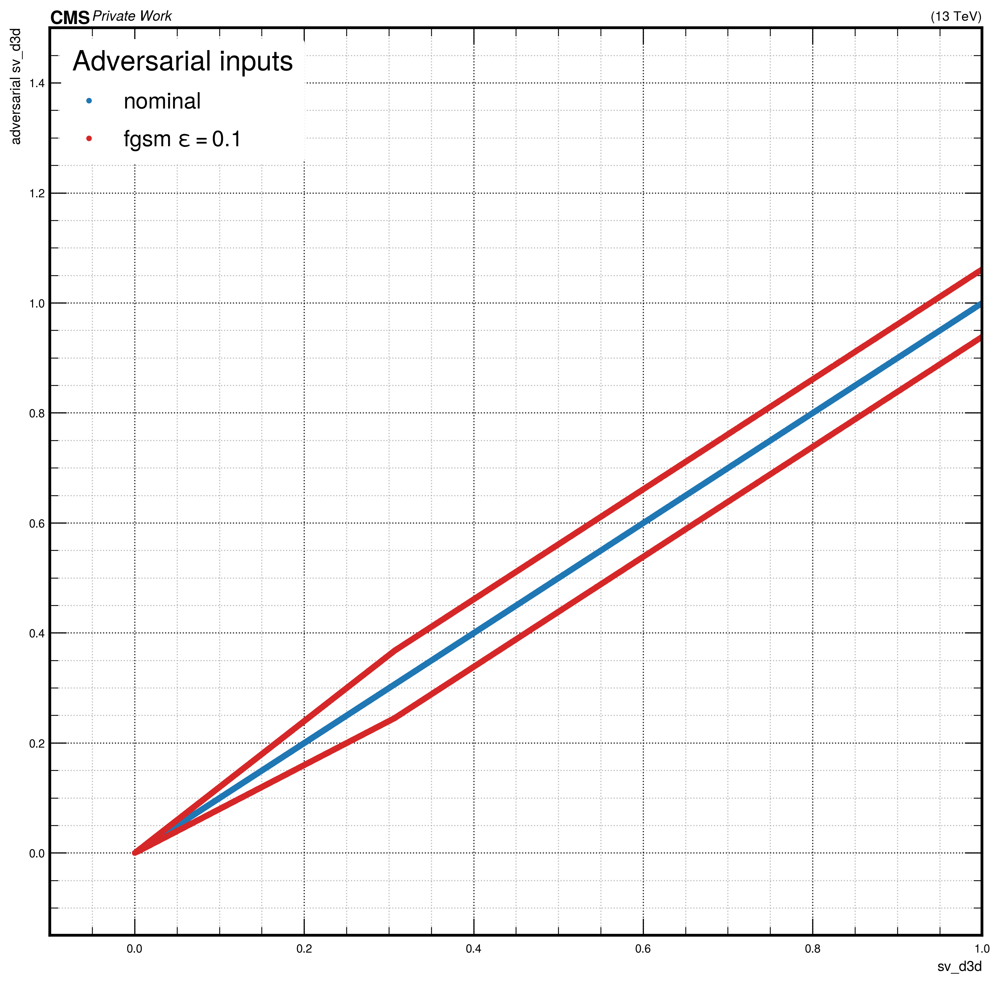

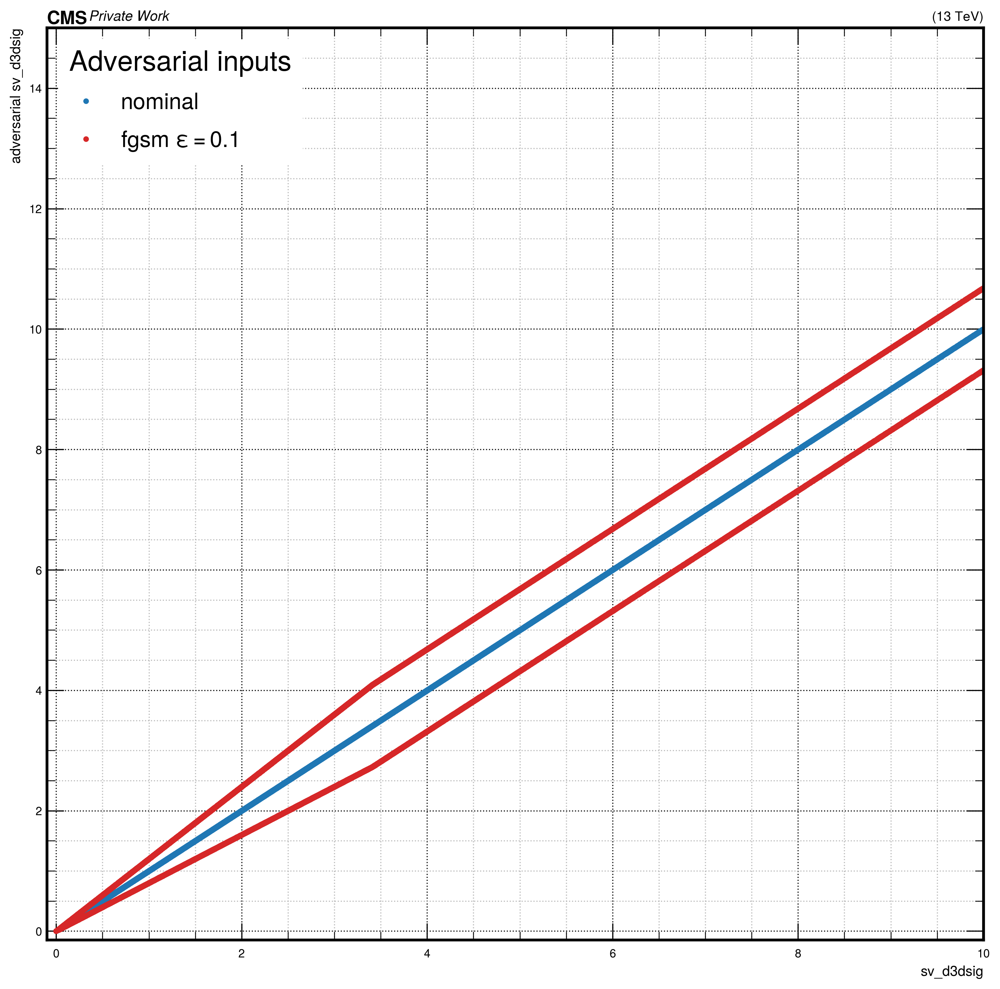

In [21]:
### Plot adversarial inputs against nominal inputs
# list of quantities and attacks to plot
quantities = ['jet_pt','jet_eta','Cpfcan_BtagPf_trackSip3dVal','Cpfcan_BtagPf_trackSip3dSig','sv_d3d','sv_d3dsig']
attacks = ['nominal','fgsm-0_1']# 'gaussian-5', 
# set ploting ranges
quantity_ranges = {
    'jet_pt': [0,100],
    'jet_eta': [-0.5,0.5],
    'Cpfcan_BtagPf_trackSip3dVal': [-1,1],
    'Cpfcan_BtagPf_trackSip3dSig': [-1,10],
    'sv_d3d': [-0.1,1],
    'sv_d3dsig': [-0.1,10],
}

for quantity in quantities:
    quantity_array = get_array(quantity)
    ranges = quantity_ranges[quantity]
    # make figure
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    ax.set_ylim(bottom=ranges[0]-0.5*abs(ranges[0]), top=ranges[1]+0.5*abs(ranges[1]))
    ax.set_xlim(left=ranges[0], right=ranges[1])
    ax.set_ylabel('adversarial '+quantity_labels[quantity])
    ax.set_xlabel(quantity_labels[quantity])
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    for attack in attacks:
        adv_quantity_array = get_array(quantity, attack=attack)
        label = attack_labels[attack]
        color = attack_colors[attack]
        ax.plot(quantity_array, adv_quantity_array, label=label, color=color, linestyle='None', marker='.') 
    legloc = 'upper left'
    leg=ax.legend(title='Adversarial inputs', fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/attacks/attack_profile-{}.pdf'.format(saveDir,quantity))


[0. 0. 0. ... 0. 0. 0.]
[0.10000001 0.10000001 0.10000001 ... 0.10000001 0.10000001 0.10000001]
[0.11536027 0.11496533 0.00510257 ... 0.04613493 0.0180774  0.07116515]


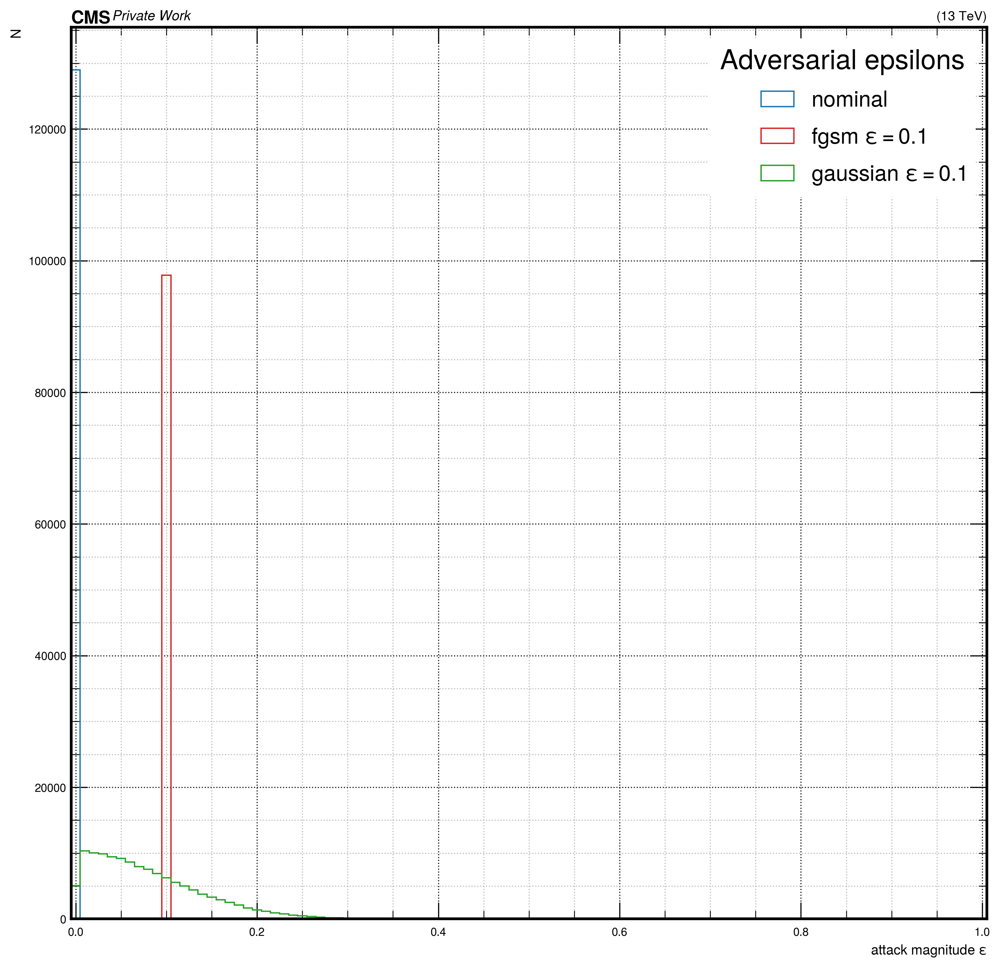

In [22]:
### Plot attack magnitudes (epsilons) of the adversarial inputs

quantity = 'jet_pt'
quantity_delta = global_deltas[0]
restrict_impact = 0.2
# list of attacks
attacks = ['nominal', 'fgsm-0_1','gaussian-0_1']
# choose binning: [left edge, right edge, Nbins] and center it
binning = [0,1,100]
binwidth = (binning[1]-binning[0])/binning[2]
left_edge = binning[0] - 0.5 * binwidth
right_edge = binning[1] + 0.5 * binwidth
Nbins = binning[2] + 1

# make figure
fig,ax = plt.subplots(figsize=[12,12], dpi=300)
ax.set_xlim(left = left_edge, right = right_edge)
ax.set_ylabel('N')
ax.set_xlabel('attack magnitude $\epsilon$')
ax.grid(which='minor', alpha=0.85)
ax.grid(which='major', alpha=0.95, color='black')
for attack in attacks:
    quantity_array = get_array(quantity)
    adv_quantity_array = get_array(quantity, attack=attack)
    label = attack_labels[attack]
    color = attack_colors[attack]
    # calculate epsilons (reverse engineering)
    delta = np.abs(adv_quantity_array-quantity_array)
    no_restrict_impact = np.where(np.abs(delta/quantity_array-restrict_impact)>0.00001)[0]
    epsilons = delta[no_restrict_impact]/quantity_delta
    # plot histogram
    ax.hist(epsilons, range=(left_edge,right_edge), bins=Nbins, label=label, color=color, histtype='step')
legloc = 'upper right'
leg=ax.legend(title='Adversarial epsilons', fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
if 'right' in legloc:
    aligned = 'right'
else:
    aligned = 'left'
leg._legend_box.align = aligned
leg.get_frame().set_linewidth(0.0)
hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
fig.savefig('{}/attacks/attack-epsilons.pdf'.format(saveDir))

74.73113250732422
0.6145051717758179
0.5289318561553955


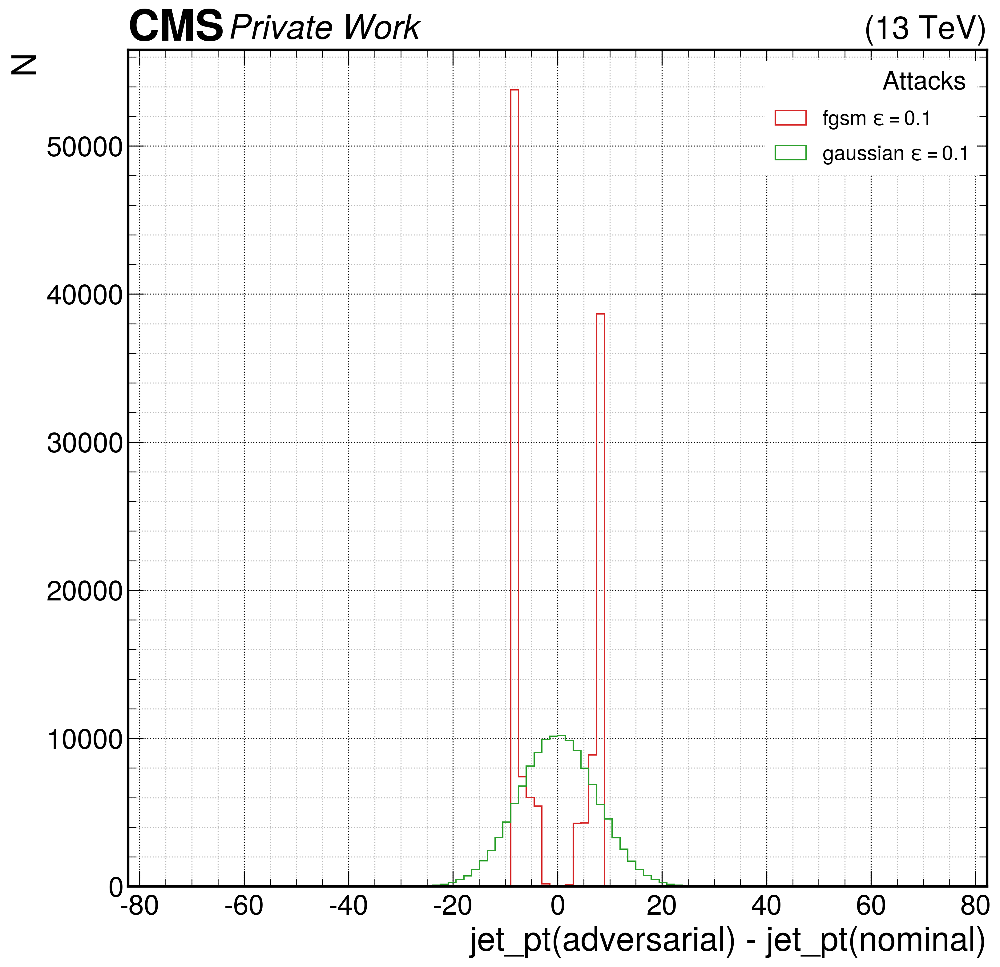

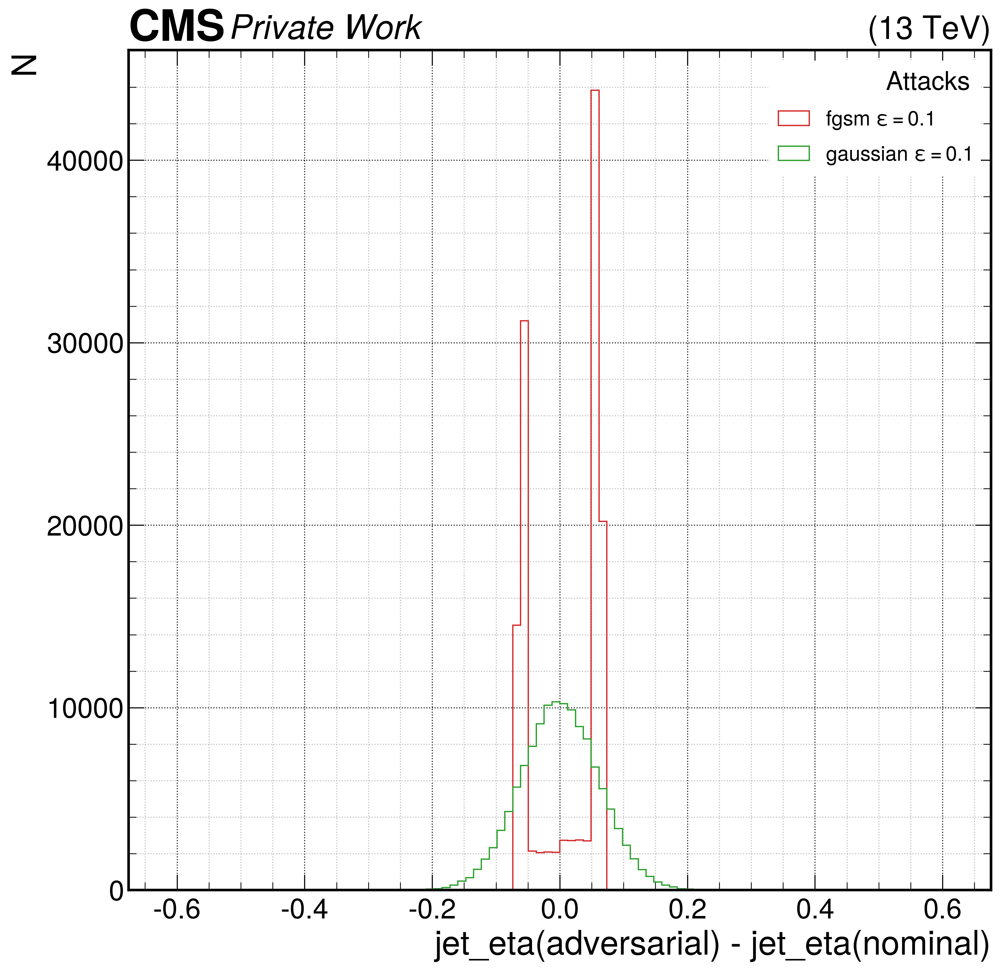

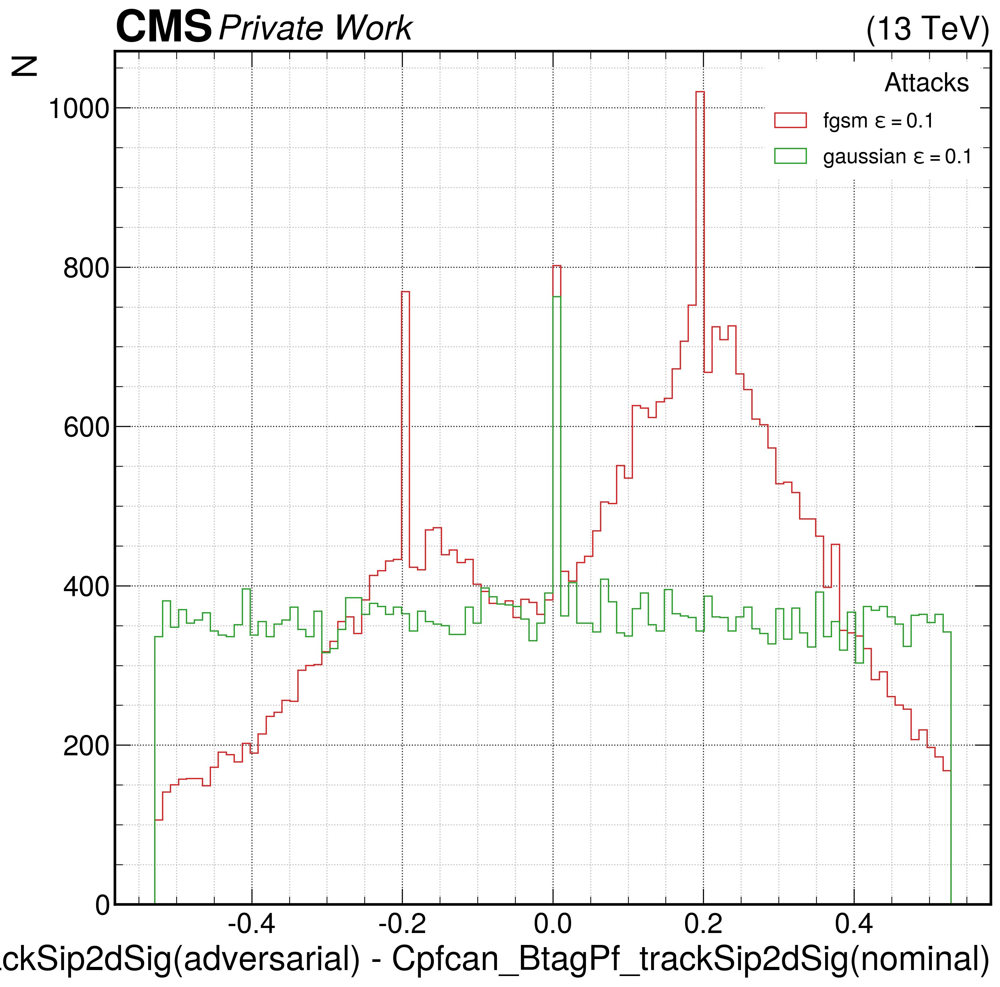

In [28]:
### Plot input shifts of the attacks

quantities = ['jet_pt','jet_eta','Cpfcan_BtagPf_trackSip2dSig']
# list of attacks
attacks = ['fgsm-0_1', 'gaussian-0_1']
# choose number of Bins
Nbins = 100
range = 1

for quantity in quantities:
    # load quantity delta and choose binning
    index = quantity_indices[quantity]
    if index[0]=='glob':
        input_delta = input_deltas[index[0]][index[1]]
    else:
        input_delta = input_deltas[index[0]][index[1]][index[2]]
    print(input_delta)
    # make figure
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    ax.set_ylabel('N')
    ax.set_xlabel('{}(adversarial) - {}(nominal)'.format(quantity,quantity))
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    for attack in attacks:
        # compute difference: adversarial - nominal
        quantity_array = get_array(quantity)
        adv_quantity_array = get_array(quantity, attack=attack)
        deltas = adv_quantity_array-quantity_array
        # choose label and color
        label = attack_labels[attack]
        color = attack_colors[attack]
        # plot histogram
        ax.hist(deltas, range=(-range*input_delta,range*input_delta), bins=Nbins, label=label, color=color, histtype='step')
    legloc = 'upper right'
    leg=ax.legend(title='Attacks', fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/attacks/attack_deltas-{}.pdf'.format(saveDir,quantity))


global: min -12.83206844329834 , max 102.12703704833984 , smallest 0.0031177487690001726
cpf: min -0.918181836605072 , max 37.28020477294922 , smallest 0.0009657744085416198
npf: min -0.8290451765060425 , max 0.9338585138320923 , smallest 3.376684617251158e-05
vtx: min -0.19916857779026031 , max 12.39177417755127 , smallest 0.0008389248978346586


/net/scratch_cms3a/hschoenen/miniconda3/envs/deepjet_env/lib/python3.9/site-packages/matplotlib/ticker.py:2937: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)
/net/scratch_cms3a/hschoenen/miniconda3/envs/deepjet_env/lib/python3.9/site-packages/matplotlib/ticker.py:2937: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)
/net/scratch_cms3a/hschoenen/miniconda3/envs/deepjet_env/lib/python3.9/site-packages/matplotlib/ticker.py:2937: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)
/net/scratch_cms3a/hschoenen/miniconda3/envs/deepjet_env/lib/python3.9/site-packages/matplotlib/ticker.py:2937: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)


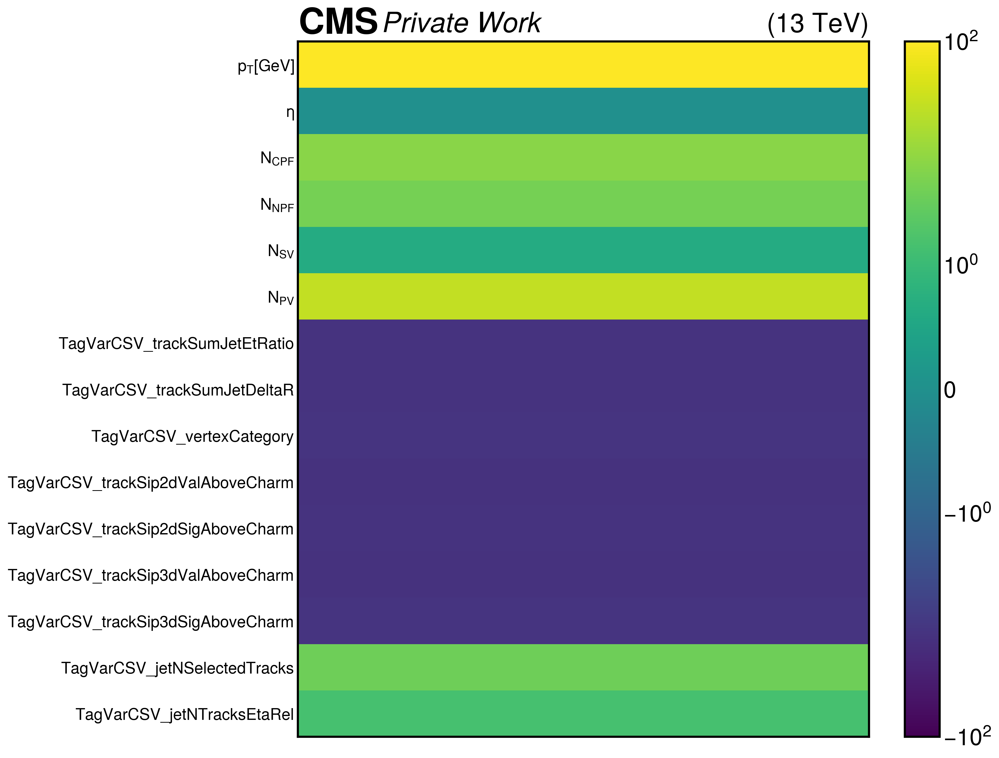

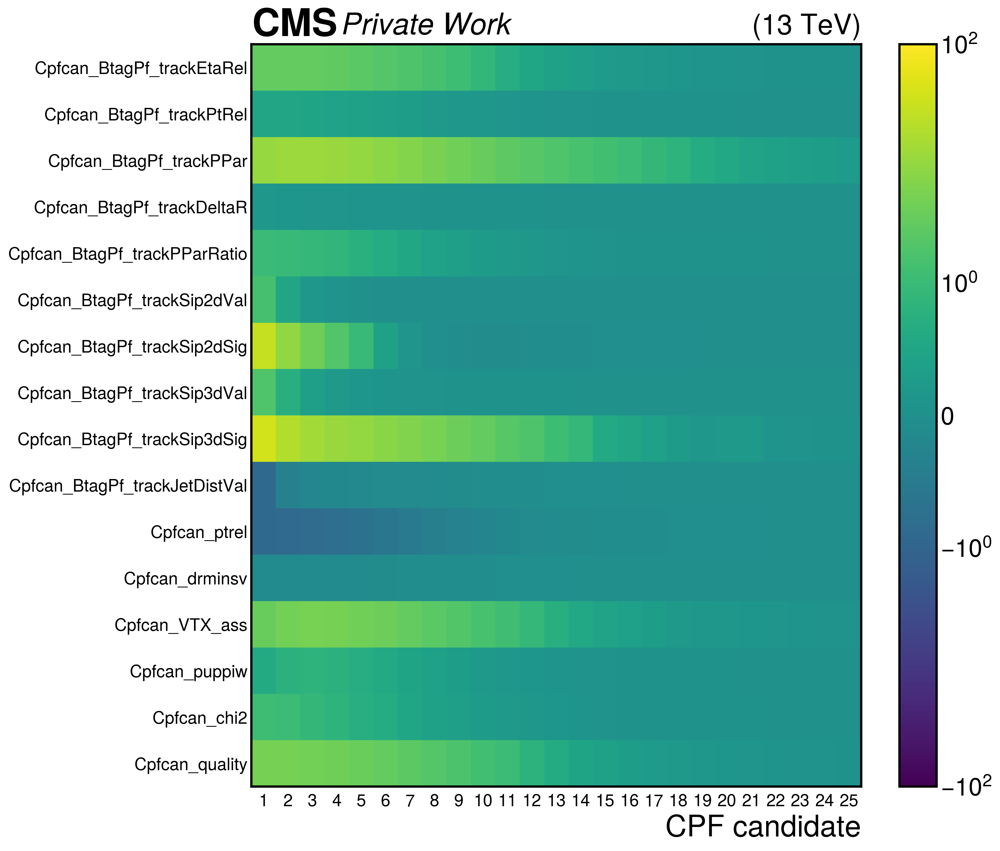

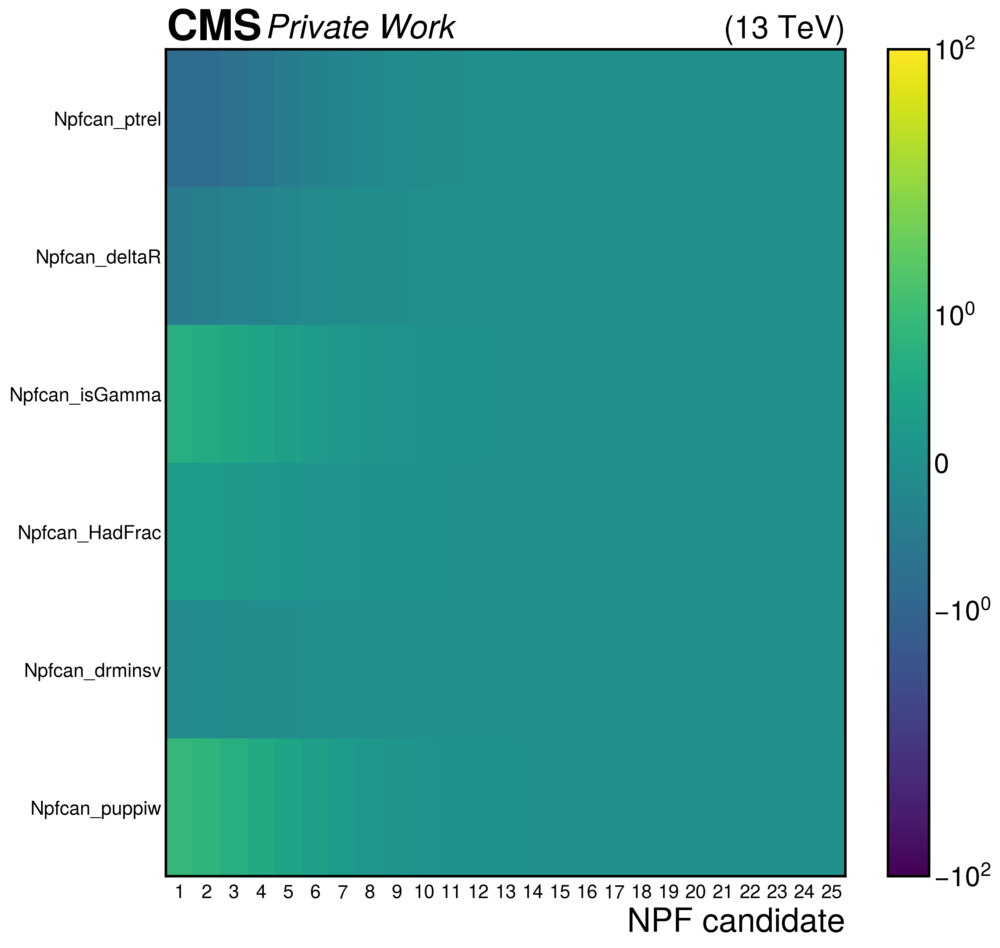

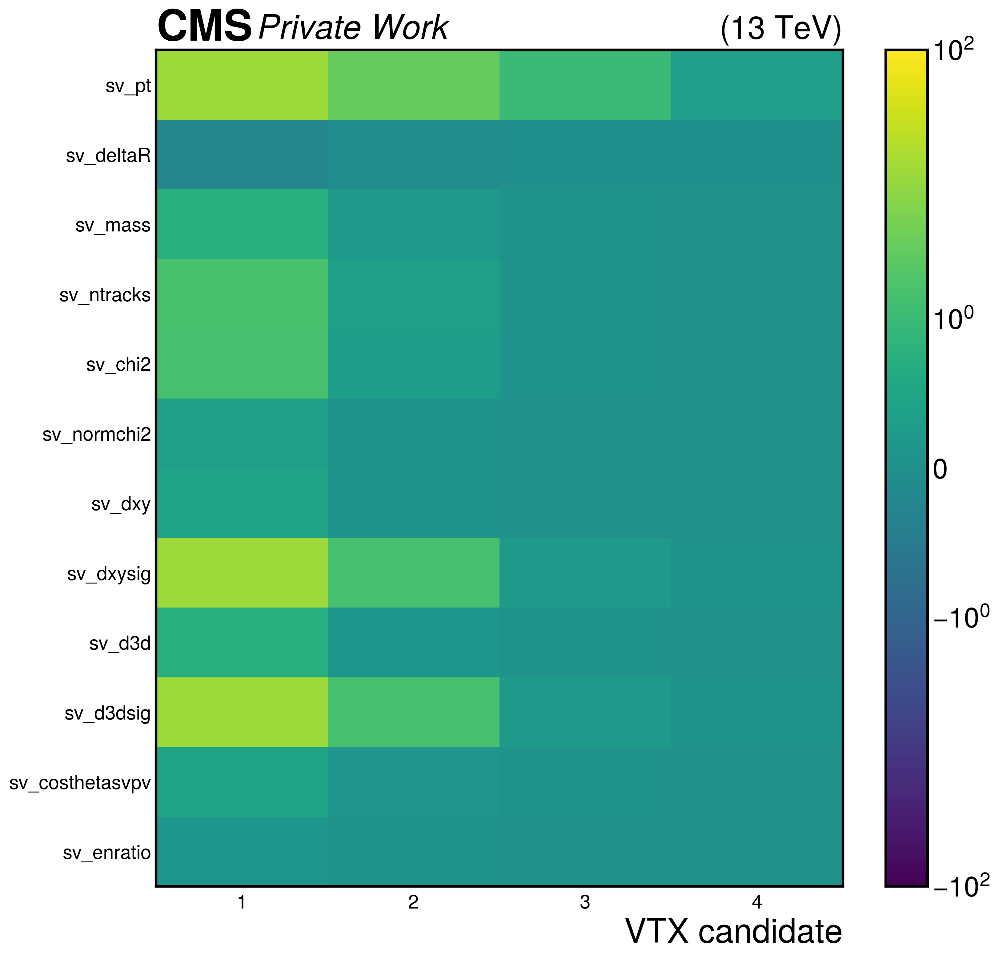

In [5]:
### Make some variable overview

global_variables = ['jet_pt','jet_eta', 'nCpfcand','nNpfcand', 'nsv','npv', 'TagVarCSV_trackSumJetEtRatio', 'TagVarCSV_trackSumJetDeltaR', 'TagVarCSV_vertexCategory', 'TagVarCSV_trackSip2dValAboveCharm', 'TagVarCSV_trackSip2dSigAboveCharm', 'TagVarCSV_trackSip3dValAboveCharm', 'TagVarCSV_trackSip3dSigAboveCharm', 'TagVarCSV_jetNSelectedTracks', 'TagVarCSV_jetNTracksEtaRel']
cpf_variables = ['Cpfcan_BtagPf_trackEtaRel', 'Cpfcan_BtagPf_trackPtRel', 'Cpfcan_BtagPf_trackPPar', 'Cpfcan_BtagPf_trackDeltaR', 'Cpfcan_BtagPf_trackPParRatio', 'Cpfcan_BtagPf_trackSip2dVal', 'Cpfcan_BtagPf_trackSip2dSig', 'Cpfcan_BtagPf_trackSip3dVal', 'Cpfcan_BtagPf_trackSip3dSig', 'Cpfcan_BtagPf_trackJetDistVal', 'Cpfcan_ptrel', 'Cpfcan_drminsv', 'Cpfcan_VTX_ass', 'Cpfcan_puppiw', 'Cpfcan_chi2', 'Cpfcan_quality']
npf_variables = ['Npfcan_ptrel', 'Npfcan_deltaR', 'Npfcan_isGamma', 'Npfcan_HadFrac', 'Npfcan_drminsv', 'Npfcan_puppiw']
vtx_variables = ['sv_pt','sv_deltaR', 'sv_mass', 'sv_ntracks', 'sv_chi2', 'sv_normchi2', 'sv_dxy', 'sv_dxysig', 'sv_d3d', 'sv_d3dsig', 'sv_costhetasvpv', 'sv_enratio']

# load variable arrays
global_array = np.load('{}/variables/glob_array.npy'.format(modelDir))
cpf_array = np.load('{}/variables/cpf_array.npy'.format(modelDir))
npf_array = np.load('{}/variables/npf_array.npy'.format(modelDir))
vtx_array = np.load('{}/variables/vtx_array.npy'.format(modelDir))

# compute mean values
global_mean = np.mean(global_array,axis=0)
cpf_mean = np.mean(cpf_array,axis=0)
npf_mean = np.mean(npf_array,axis=0)
vtx_mean = np.mean(vtx_array,axis=0)

# print information
print(f'global: min {np.min(global_mean)} , max {np.max(global_mean)} , smallest {np.min(np.abs(global_mean))}')
print(f'cpf: min {np.min(cpf_mean)} , max {np.max(cpf_mean)} , smallest {np.min(np.abs(cpf_mean))}')
print(f'npf: min {np.min(npf_mean)} , max {np.max(npf_mean)} , smallest {np.min(np.abs(npf_mean))}')
print(f'vtx: min {np.min(vtx_mean)} , max {np.max(vtx_mean)} , smallest {np.min(np.abs(vtx_mean))}')

# check the ordering of the candidates
'''
for vartype in ['cpf','npf','vtx']:
    if vartype == 'cpf':
        array = cpf_array
        variables = cpf_variables
    elif vartype == 'npf':
        array = npf_array
        variables = npf_variables
    elif vartype == 'vtx':
        array = vtx_array
        variables = vtx_variables
    print(vartype)
    for i,variable in enumerate(variables):
        counter = 0
        for j in range(len(means[:,0])-1):
            if means[j,i]>means[j+1,i]:
                counter+=1
        print(counter)
        if counter==len(means[:,0])-1:
            print(f'{vartype} candidates are ordered by {variable}')
'''      

for vartype in ['global','cpf','npf','vtx']:
    if vartype == 'global':
        rating = global_mean
        N_objects = 1
        x_label = ''
        variables = ['jet_pt','jet_eta', 'nCpfcand','nNpfcand', 'nsv','npv', 'TagVarCSV_trackSumJetEtRatio', 'TagVarCSV_trackSumJetDeltaR', 'TagVarCSV_vertexCategory', 'TagVarCSV_trackSip2dValAboveCharm', 'TagVarCSV_trackSip2dSigAboveCharm', 'TagVarCSV_trackSip3dValAboveCharm', 'TagVarCSV_trackSip3dSigAboveCharm', 'TagVarCSV_jetNSelectedTracks', 'TagVarCSV_jetNTracksEtaRel']
    elif vartype == 'cpf':
        rating = cpf_mean
        N_objects = 25
        x_label = 'CPF candidate'
        variables = ['Cpfcan_BtagPf_trackEtaRel', 'Cpfcan_BtagPf_trackPtRel', 'Cpfcan_BtagPf_trackPPar', 'Cpfcan_BtagPf_trackDeltaR', 'Cpfcan_BtagPf_trackPParRatio', 'Cpfcan_BtagPf_trackSip2dVal', 'Cpfcan_BtagPf_trackSip2dSig', 'Cpfcan_BtagPf_trackSip3dVal', 'Cpfcan_BtagPf_trackSip3dSig', 'Cpfcan_BtagPf_trackJetDistVal', 'Cpfcan_ptrel', 'Cpfcan_drminsv', 'Cpfcan_VTX_ass', 'Cpfcan_puppiw', 'Cpfcan_chi2', 'Cpfcan_quality']
    elif vartype == 'npf':
        rating = npf_mean
        N_objects = 25
        x_label = 'NPF candidate'
        variables = ['Npfcan_ptrel', 'Npfcan_deltaR', 'Npfcan_isGamma', 'Npfcan_HadFrac', 'Npfcan_drminsv', 'Npfcan_puppiw']
    elif vartype == 'vtx':
        rating = vtx_mean
        N_objects = 4
        x_label = 'VTX candidate'
        variables = ['sv_pt','sv_deltaR', 'sv_mass', 'sv_ntracks', 'sv_chi2', 'sv_normchi2', 'sv_dxy', 'sv_dxysig', 'sv_d3d', 'sv_d3dsig', 'sv_costhetasvpv', 'sv_enratio']
    N_variables = len(variables)
    y_label = ''
    # create arrays
    x = []
    y = []
    values = []
    for i in range(N_objects):
        for j in range(N_variables):
            x.append(i + 0.5)
            y.append(N_variables-(j + 0.5))
            if vartype=='global':
                values.append(rating[j])
            else:
                values.append(rating[i,j])
                
    # choose binnings
    x_binning = np.arange(0,N_objects+1)
    y_binning = np.arange(0,N_variables+1)
    
    # create figure
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    plt.style.use(hep.cms.style.ROOT)
    ax.set_xlim(left=0, right=N_objects)
    ax.set_ylim(bottom=0, top=N_variables)
    # choose ticks
    x_ticks = []
    x_ticklabels = []
    if vartype!='global':
        for i in range(N_objects):
            x_ticks.append(i + 0.5)
            x_ticklabels.append('{}'.format(i+1))
    y_ticks = []
    y_ticklabels = []
    for j in range(N_variables):
        y_ticks.append(N_variables-(j + 0.5))
        y_ticklabels.append(quantity_labels[variables[j]])
    ax.set_xticks(x_ticks, labels=x_ticklabels, fontsize=15)
    ax.set_yticks(y_ticks, labels=y_ticklabels, fontsize=15)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    # plot histograms
    h = ax.hist2d(x, y, bins=[x_binning, y_binning], weights=values, norm=mpl.colors.SymLogNorm(linthresh=1,vmin=-100,vmax=100))#, cmap=mpl.cm.gray)
    # make a colorbar
    label = ''
    name = 'mean'
    cb = fig.colorbar(h[3], ax=ax, ticks=[-100,-1,0,1,100])#, label=label)
    cb.set_label(label=label,rotation=0,labelpad=20)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/{}-{}.pdf'.format(saveDir,name,vartype))


In [ ]:
### Make some simple feature ranking

# plot gradient or gradient*epsilon
weight_with_epsilon = False

# load gradients
global_gradients = np.load('{}/variables/glob_gradients.npy'.format(modelDir))
cpf_gradients = np.load('{}/variables/cpf_gradients.npy'.format(modelDir))
npf_gradients = np.load('{}/variables/npf_gradients.npy'.format(modelDir))
vtx_gradients = np.load('{}/variables/vtx_gradients.npy'.format(modelDir))
# load epsilon tensors
global_epsilons = np.load('/home/home1/institut_3a/hschoenen/repositories/DeepJet/epsilons/global_standardized_epsilons.npy')
cpf_epsilons = np.load('/home/home1/institut_3a/hschoenen/repositories/DeepJet/epsilons/cpf_standardized_epsilons.npy')
npf_epsilons = np.load('/home/home1/institut_3a/hschoenen/repositories/DeepJet/epsilons/npf_standardized_epsilons.npy')
vtx_epsilons = np.load('/home/home1/institut_3a/hschoenen/repositories/DeepJet/epsilons/vtx_standardized_epsilons.npy')
# integer variable list
integer_variables_by_candidate = {
    'global' : [2,3,4,5,8,13,14],
    'cpf' : [12,13,14,15], # adding 14 because chi2 is an approximante integer
    'npf' : [2],
    'vtx' : [3],
}

# compute feature ranking
global_gradient_mean = np.sum(np.abs(global_gradients),axis=0)/len(global_gradients[0])
if weight_with_epsilon:
    global_rating = global_gradient_mean*global_epsilons
else:
    global_rating = global_gradient_mean
cpf_gradient_mean = np.sum(np.abs(cpf_gradients),axis=0)/len(cpf_gradients[0])
cpf_epsilons = np.swapaxes(cpf_epsilons, 0, 1)
if weight_with_epsilon:
    cpf_rating = cpf_gradient_mean*cpf_epsilons
else:
    cpf_rating = cpf_gradient_mean
npf_gradient_mean = np.sum(np.abs(npf_gradients),axis=0)/len(npf_gradients[0])
npf_epsilons = np.swapaxes(npf_epsilons, 0, 1)
if weight_with_epsilon:
    npf_rating = npf_gradient_mean*npf_epsilons
else:
    npf_rating = npf_gradient_mean
vtx_gradient_mean = np.sum(np.abs(vtx_gradients),axis=0)/len(vtx_gradients[0])
vtx_epsilons = np.swapaxes(vtx_epsilons, 0, 1)
if weight_with_epsilon:
    vtx_rating = vtx_gradient_mean*vtx_epsilons
else:
    vtx_rating = vtx_gradient_mean

for vartype in ['global','cpf','npf','vtx']:
    if vartype == 'global':
        rating = global_rating
        N_objects = 1
        x_label = ''
        variables = ['jet_pt','jet_eta', 'nCpfcand','nNpfcand', 'nsv','npv', 'TagVarCSV_trackSumJetEtRatio', 'TagVarCSV_trackSumJetDeltaR', 'TagVarCSV_vertexCategory', 'TagVarCSV_trackSip2dValAboveCharm', 'TagVarCSV_trackSip2dSigAboveCharm', 'TagVarCSV_trackSip3dValAboveCharm', 'TagVarCSV_trackSip3dSigAboveCharm', 'TagVarCSV_jetNSelectedTracks', 'TagVarCSV_jetNTracksEtaRel']
    elif vartype == 'cpf':
        rating = cpf_rating
        N_objects = 25
        x_label = 'CPF candidate'
        variables = ['Cpfcan_BtagPf_trackEtaRel', 'Cpfcan_BtagPf_trackPtRel', 'Cpfcan_BtagPf_trackPPar', 'Cpfcan_BtagPf_trackDeltaR', 'Cpfcan_BtagPf_trackPParRatio', 'Cpfcan_BtagPf_trackSip2dVal', 'Cpfcan_BtagPf_trackSip2dSig', 'Cpfcan_BtagPf_trackSip3dVal', 'Cpfcan_BtagPf_trackSip3dSig', 'Cpfcan_BtagPf_trackJetDistVal', 'Cpfcan_ptrel', 'Cpfcan_drminsv', 'Cpfcan_VTX_ass', 'Cpfcan_puppiw', 'Cpfcan_chi2', 'Cpfcan_quality']
    elif vartype == 'npf':
        rating = npf_rating
        N_objects = 25
        x_label = 'NPF candidate'
        variables = ['Npfcan_ptrel', 'Npfcan_deltaR', 'Npfcan_isGamma', 'Npfcan_HadFrac', 'Npfcan_drminsv', 'Npfcan_puppiw']
    elif vartype == 'vtx':
        rating = vtx_rating
        N_objects = 4
        x_label = 'VTX candidate'
        variables = ['sv_pt','sv_deltaR', 'sv_mass', 'sv_ntracks', 'sv_chi2', 'sv_normchi2', 'sv_dxy', 'sv_dxysig', 'sv_d3d', 'sv_d3dsig', 'sv_costhetasvpv', 'sv_enratio']
    N_variables = len(variables)

    # set rating to zero for integer variables
    if weight_with_epsilon:
        integer_indices = integer_variables_by_candidate[vartype]
        if vartype=='global':
            rating[integer_indices] = 0
        else:
            rating[:,integer_indices] = 0
    
    # create arrays
    x = []
    y = []
    values = []
    for i in range(N_objects):
        for j in range(N_variables):
            x.append(i + 0.5)
            y.append(N_variables-(j + 0.5))
            if vartype=='global':
                values.append(rating[j])
            else:
                values.append(rating[i,j])
                
    # choose binnings
    x_binning = np.arange(0,N_objects+1)
    y_binning = np.arange(0,N_variables+1)
    
    # create figure
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    plt.style.use(hep.cms.style.ROOT)
    ax.set_xlim(left=0, right=N_objects)
    ax.set_ylim(bottom=0, top=N_variables)
    # choose ticks
    x_ticks = []
    x_ticklabels = []
    if vartype!='global':
        for i in range(N_objects):
            x_ticks.append(i + 0.5)
            x_ticklabels.append('{}'.format(i+1))
    y_ticks = []
    y_ticklabels = []
    for j in range(N_variables):
        y_ticks.append(N_variables-(j + 0.5))
        y_ticklabels.append(quantity_labels[variables[j]])
    ax.set_xticks(x_ticks, labels=x_ticklabels, fontsize=15)
    ax.set_yticks(y_ticks, labels=y_ticklabels, fontsize=15)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    # plot histograms
    h = ax.hist2d(x, y, bins=[x_binning, y_binning], weights=values, norm=mpl.colors.LogNorm(vmin=10**(-7),vmax=1))#, cmap=mpl.cm.gray)
    # make a colorbar
    if weight_with_epsilon:
        label = r'$\overline{\left | \frac{\partial L}{\partial x}\right |}\epsilon$'
        name = 'rating'
    else:
        label = r'$\overline{\left | \frac{\partial L}{\partial x}\right |}$'
        name = 'gradient'
    cb = fig.colorbar(h[3], ax=ax, ticks=[10**(-7),10**(-6),10**(-5),10**(-4),10**(-3),10**(-2),10**(-1)])#, label=label)
    cb.set_label(label=label,rotation=0,labelpad=20)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/{}-{}.pdf'.format(saveDir,name,vartype))
    

/net/scratch_cms3a/hschoenen/miniconda3/envs/deepjet_env/lib/python3.9/site-packages/matplotlib/ticker.py:2937: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)


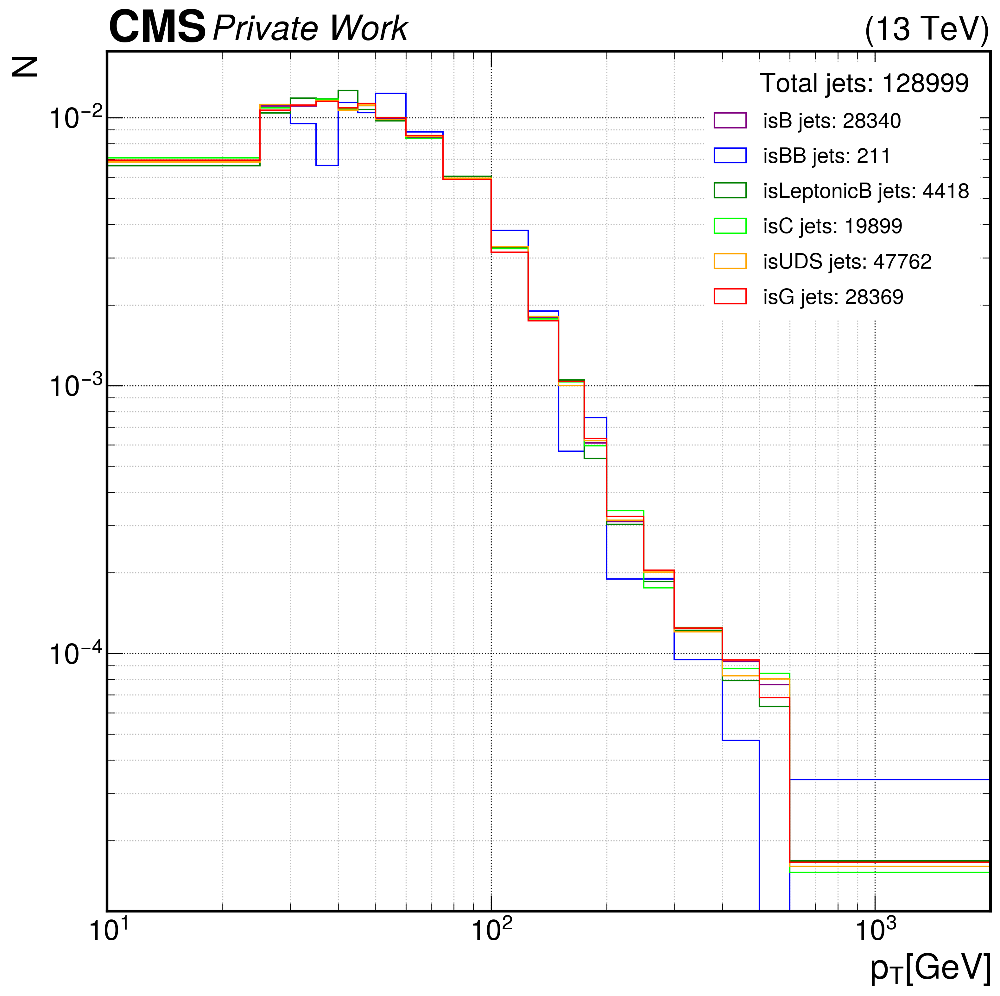

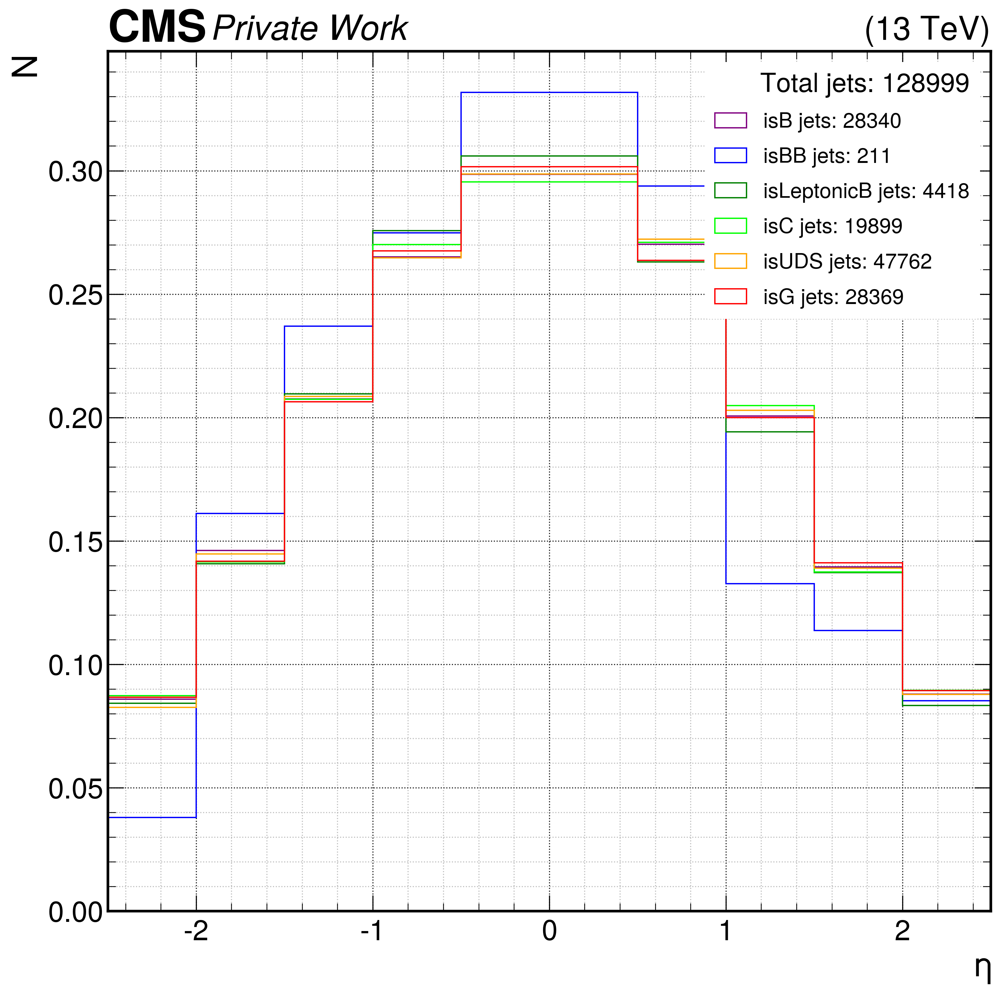

In [20]:
### Plot histograms of pt and eta for all six categories (weighting bins)
quantities = ['jet_pt', 'jet_eta']
# normalize histograms for all flavours
normalize_by_flavour = True
# specify binning: [left edge, right edge, Nbins]
quantity_binnings = {
    'jet_pt': [10,25,30,35,40,45,50,60,75,100,125,150,175,200,250,300,400,500,600,2000], 
    'jet_eta': [-2.5,-2.,-1.5,-1.,-0.5,0.5,1,1.5,2.,2.5],
}

for quantity in quantities:
    quantity_array = get_array(quantity)
    binning = quantity_binnings[quantity]
    # make figure
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    plt.style.use(hep.cms.style.ROOT)
    ax.set_xlim(left=binning[0], right=binning[-1])
    ax.set_ylabel('N')
    ax.set_xlabel(quantity_labels[quantity])
    if quantity=='jet_pt':
        ax.set_yscale('log')
        ax.set_xscale('log')
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    if normalize_by_flavour:
        ax.hist(quantity_array[isB==1], density=True, bins=binning, label='isB jets: {:n}'.format(np.sum(isB)), color='purple', histtype='step')
        ax.hist(quantity_array[isBB==1], density=True, bins=binning, label='isBB jets: {:n}'.format(np.sum(isBB)), color='blue', histtype='step')
        ax.hist(quantity_array[isLeptonicB==1], density=True, bins=binning, label='isLeptonicB jets: {:n}'.format(np.sum(isLeptonicB)), color='green', histtype='step')
        ax.hist(quantity_array[isC==1], density=True, bins=binning, label='isC jets: {:n}'.format(np.sum(isC)), color='lime', histtype='step')
        ax.hist(quantity_array[isUDS==1], density=True, bins=binning, label='isUDS jets: {:n}'.format(np.sum(isUDS)), color='orange', histtype='step')
        ax.hist(quantity_array[isG==1], density=True, bins=binning, label='isG jets: {:n}'.format(np.sum(isG)), color='red', histtype='step')
    else:
        ax.hist(quantity_array[isB==1], bins=binning, label='isB jets: {:n}'.format(np.sum(isB)), color='purple', histtype='step')
        ax.hist(quantity_array[isBB==1], bins=binning, label='isBB jets: {:n}'.format(np.sum(isBB)), color='blue', histtype='step')
        ax.hist(quantity_array[isLeptonicB==1], bins=binning, label='isLeptonicB jets: {:n}'.format(np.sum(isLeptonicB)), color='green', histtype='step')
        ax.hist(quantity_array[isC==1], bins=binning, label='isC jets: {:n}'.format(np.sum(isC)), color='lime', histtype='step')
        ax.hist(quantity_array[isUDS==1], bins=binning, label='isUDS jets: {:n}'.format(np.sum(isUDS)), color='orange', histtype='step')
        ax.hist(quantity_array[isG==1], bins=binning, label='isG jets: {:n}'.format(np.sum(isG)), color='red', histtype='step')
    legloc = 'upper right'
    leg=ax.legend(title='Total jets: {}'.format(len(isB)), fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/{}-weights.pdf'.format(saveDir,quantity))

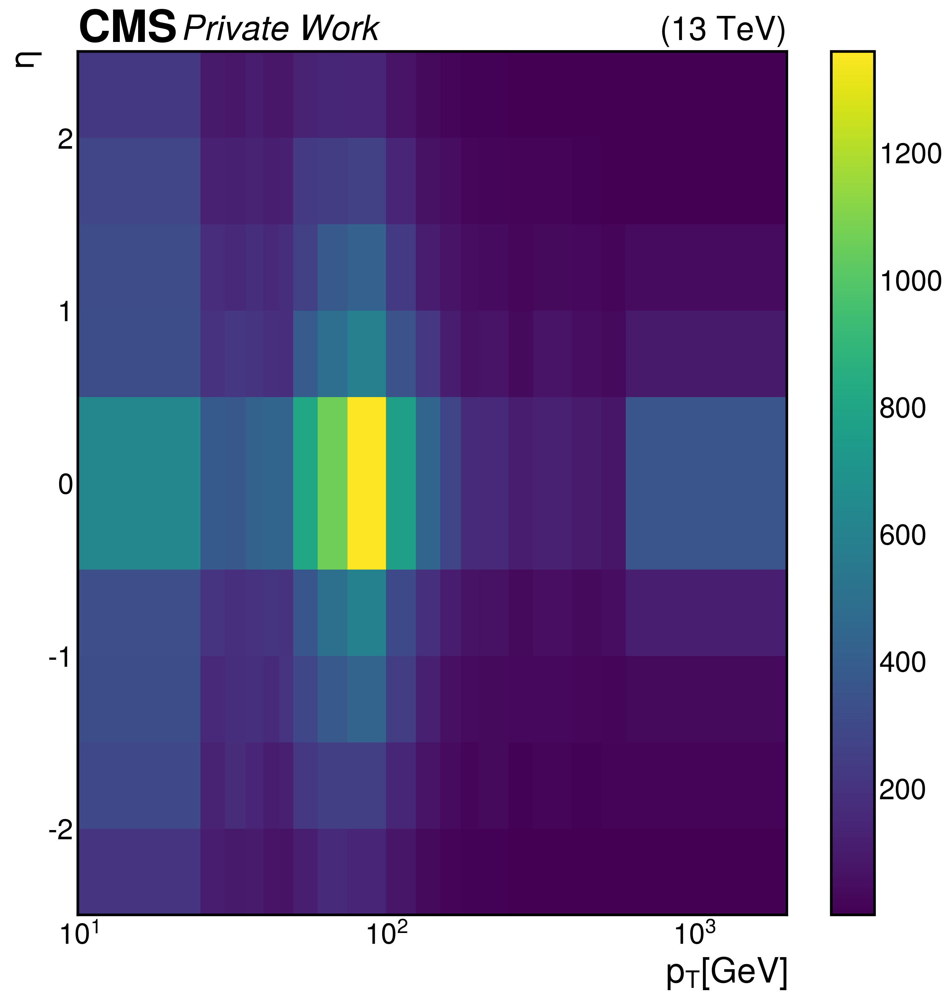

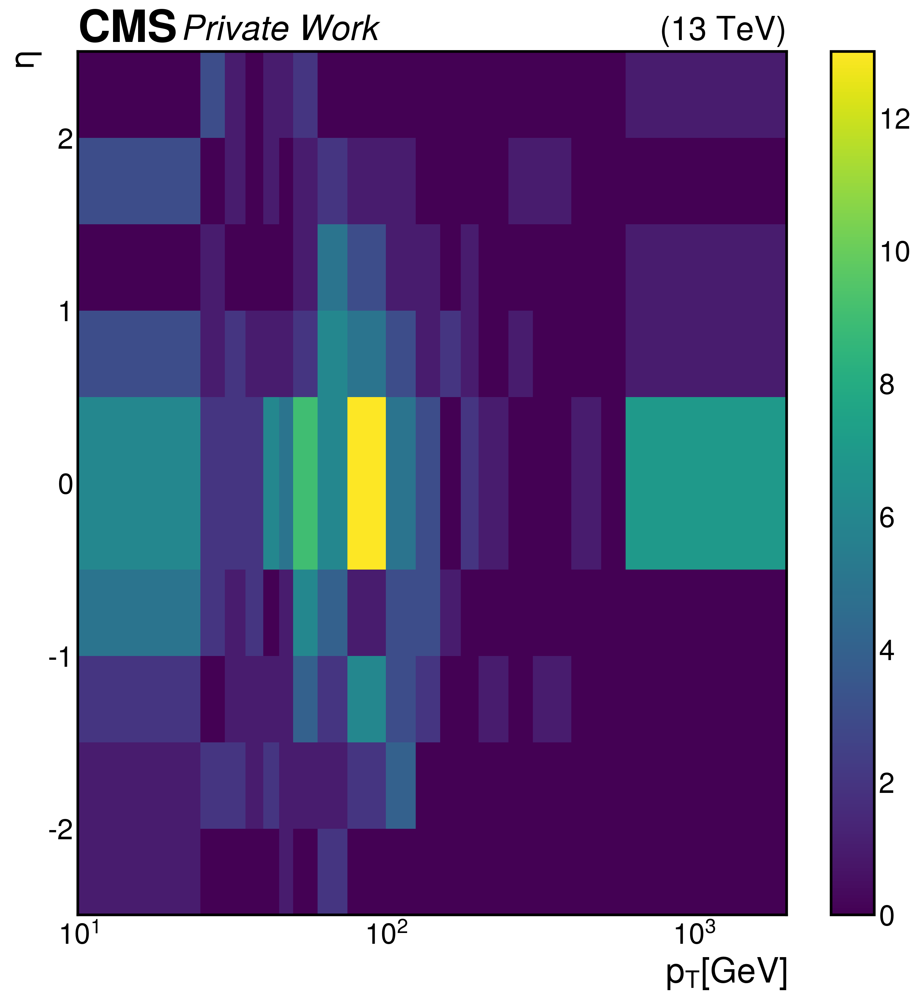

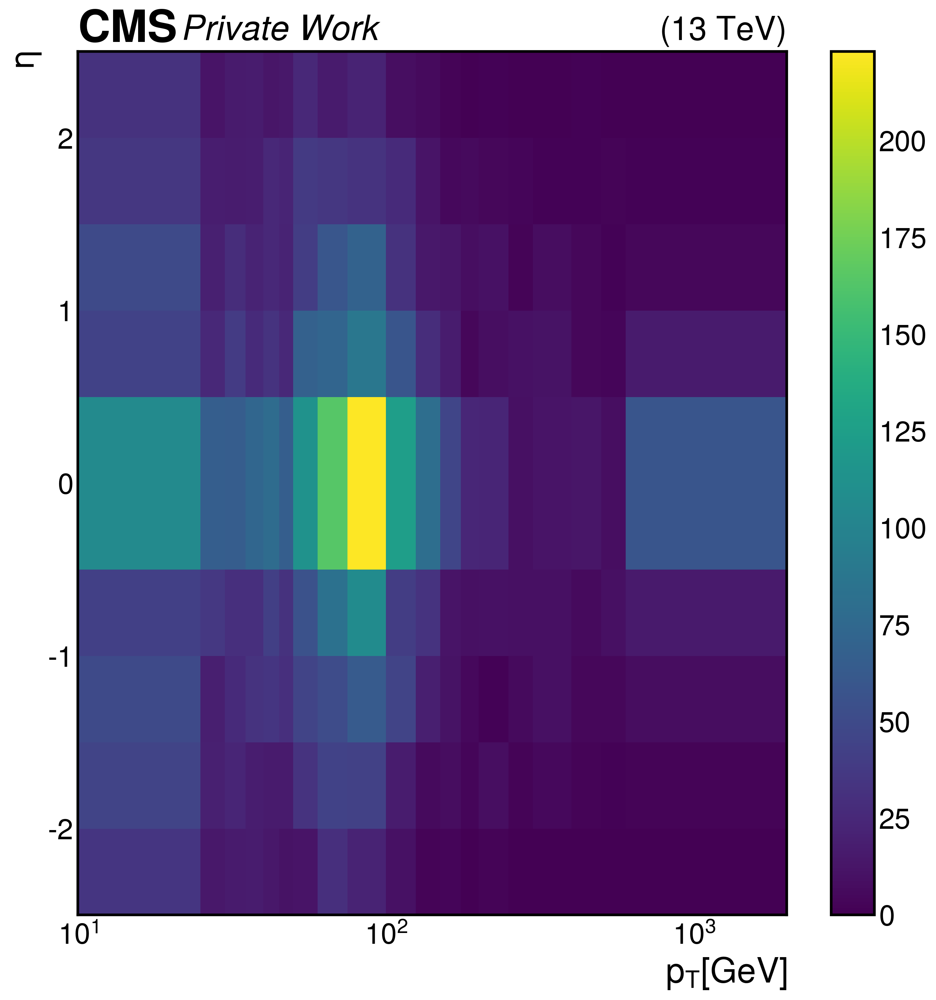

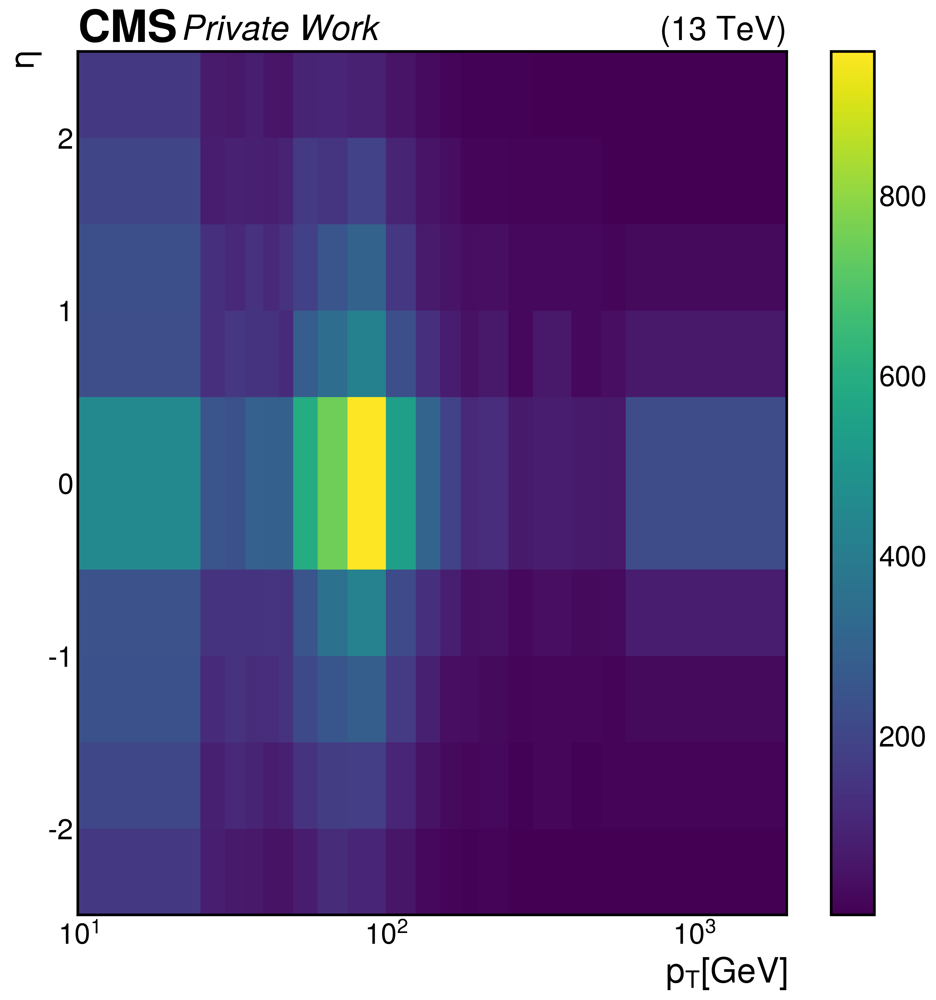

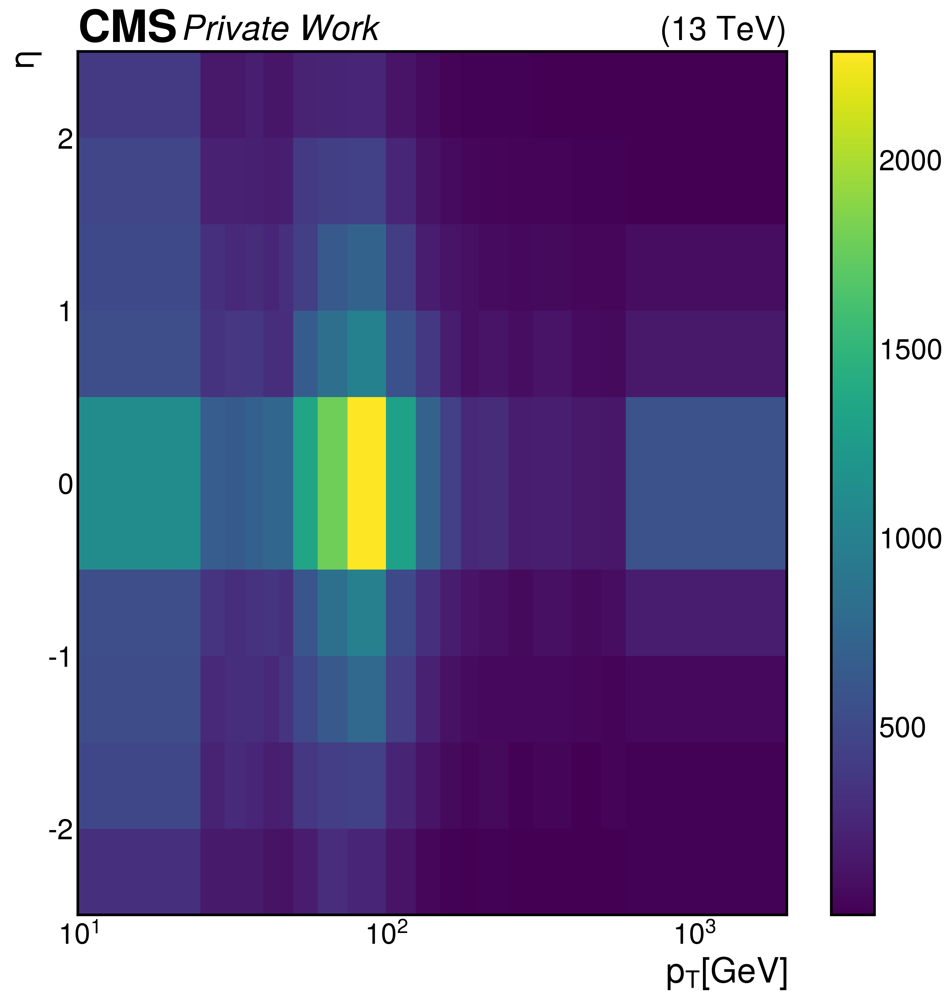

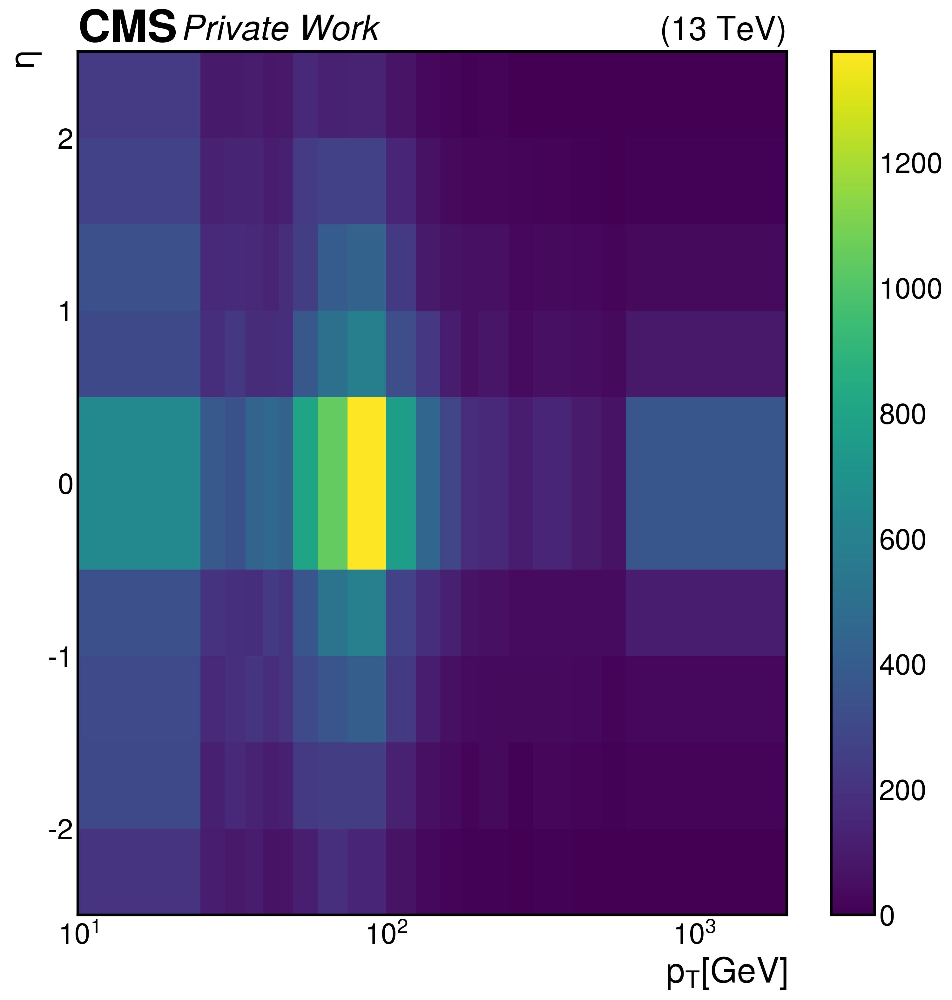

In [21]:
# print 2D histogram (pt,eta) for all 6 categories (weighting bins)
flavours = [isB,isBB,isLeptonicB,isC,isUDS,isG]
flavour_names = ['isB','isBB','isLeptonicB','isC','isUDS','isG']
quantity_binnings = {
    'jet_pt': [10,25,30,35,40,45,50,60,75,100,125,150,175,200,250,300,400,500,600,2000], 
    'jet_eta': [-2.5,-2.,-1.5,-1.,-0.5,0.5,1,1.5,2.,2.5],
}

for i,flavour in enumerate(flavours):
    x = 'jet_pt'
    y = 'jet_eta'
    x_array = get_array(x)
    y_array = get_array(y)
    x_binning = quantity_binnings[x]
    y_binning = quantity_binnings[y]
    x_label = quantity_labels[x]
    y_label = quantity_labels[y]
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    plt.style.use(hep.cms.style.ROOT)
    ax.set_xlim(left=x_binning[0], right=x_binning[-1])
    ax.set_ylim(bottom=y_binning[0], top=y_binning[-1])
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_xscale('log')
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    h = ax.hist2d(x_array[flavour==1], y_array[flavour==1], bins=[x_binning, y_binning])
    fig.colorbar(h[3], ax=ax)
    #legloc = 'upper right'
    #leg=ax.legend(title='Total jets: {}'.format(len(isB)), fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    #if 'right' in legloc:
        #aligned = 'right'
    #else:
        #aligned = 'left'
    #leg._legend_box.align = aligned
    #leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/weights-{}.pdf'.format(saveDir,flavour))

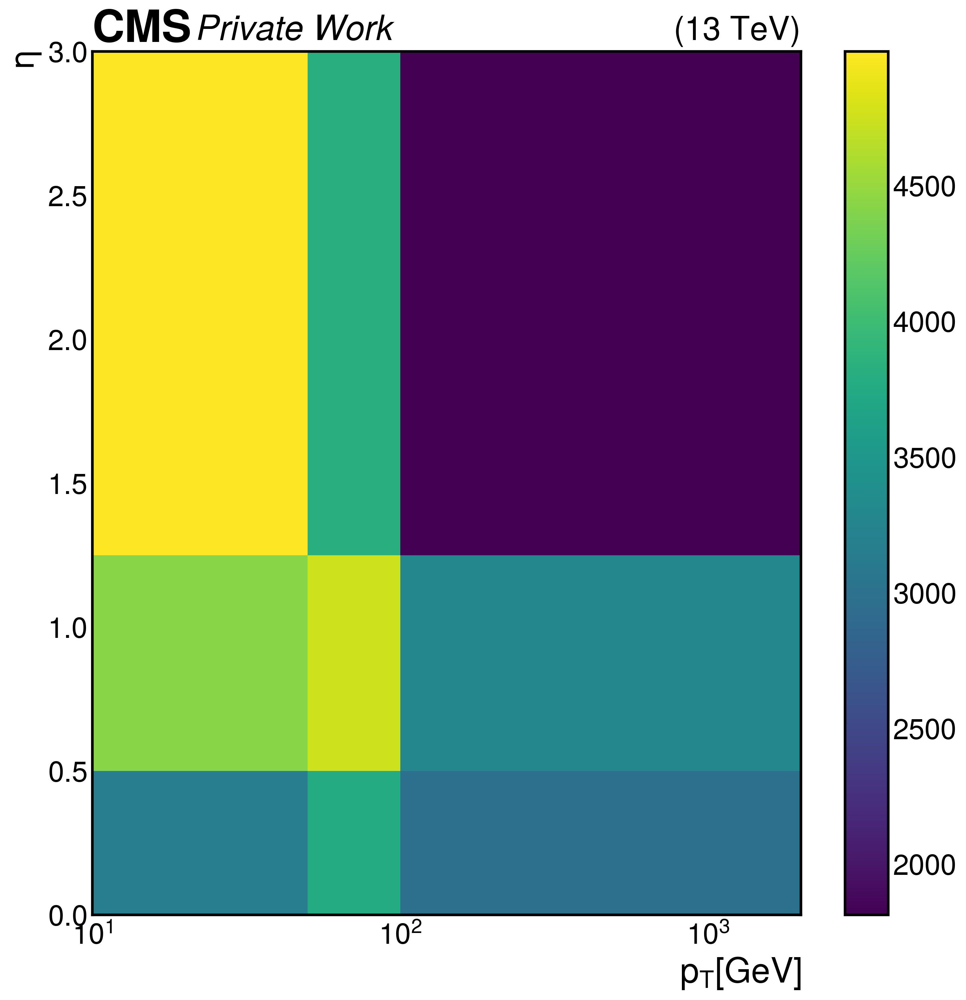

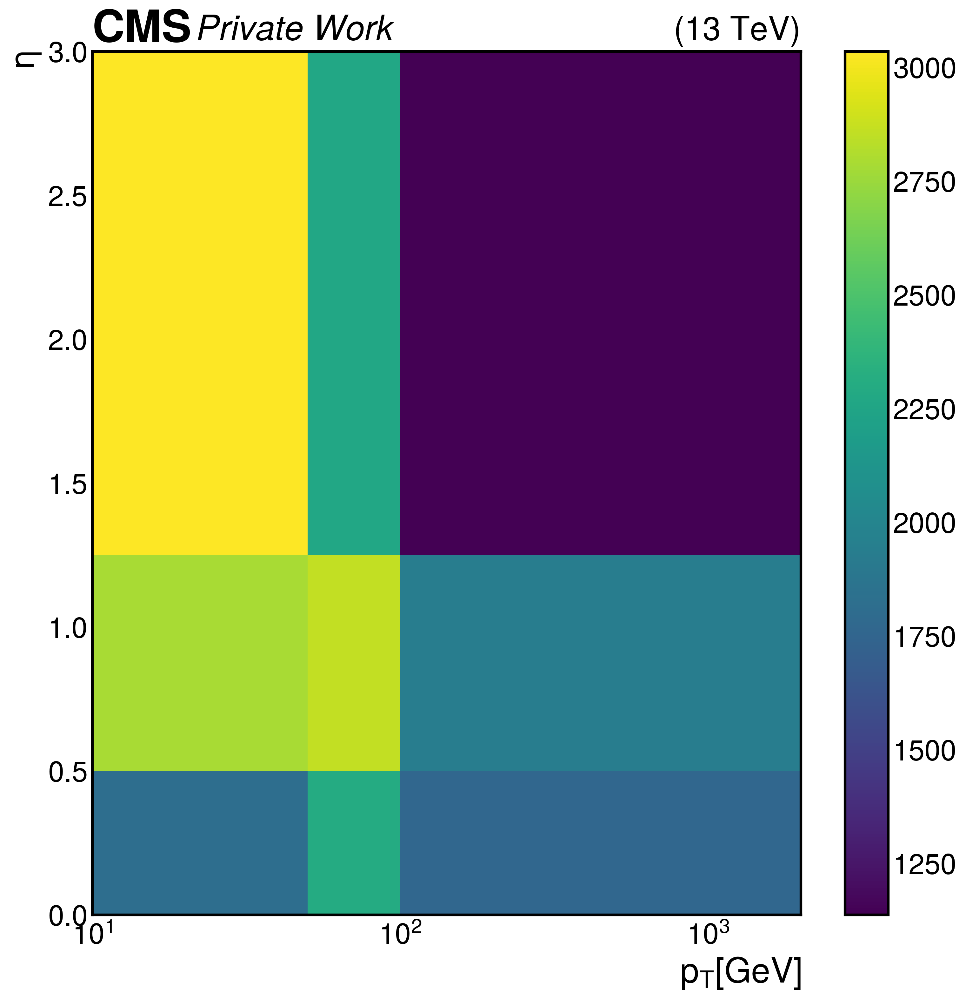

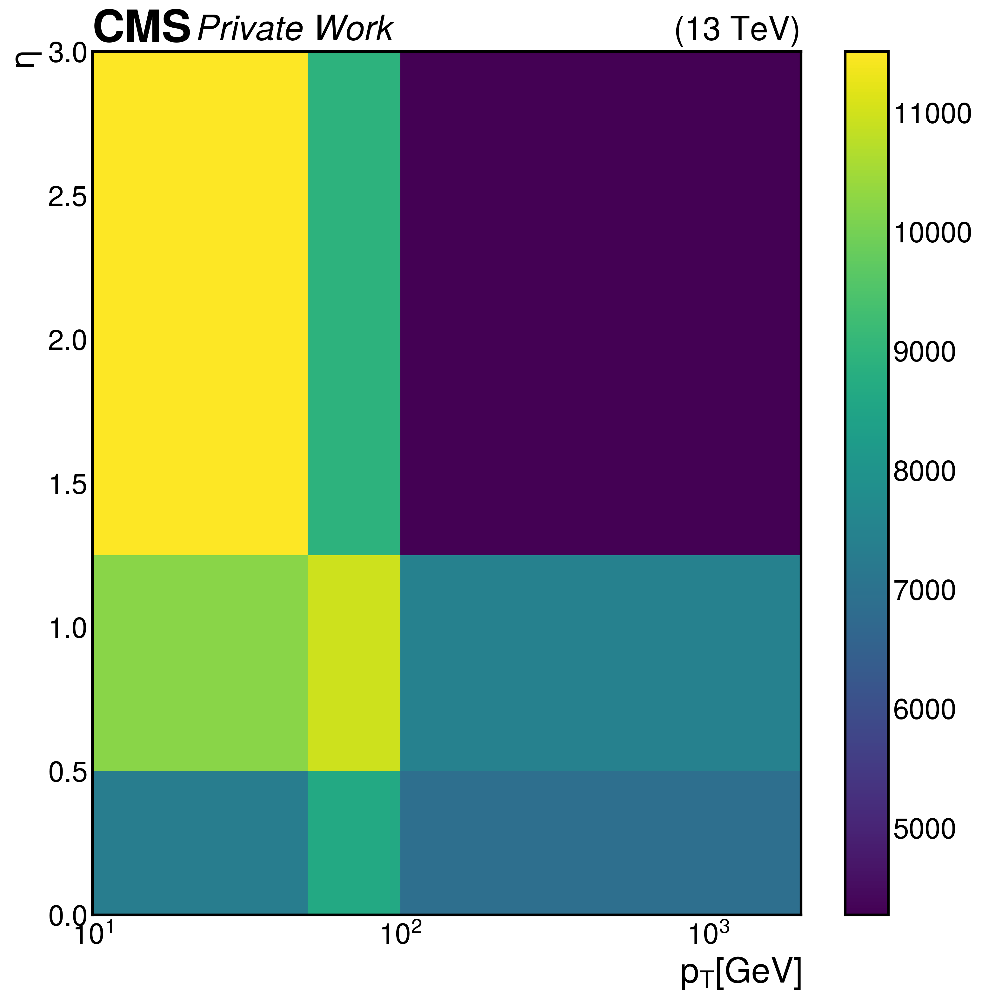

In [27]:
# print 2D histogram (pt,eta) for all 6 categories (weighting bins)
flavours = [isB+isBB+isLeptonicB,isC,isUDS+isG]
flavour_names = ['b','c','udsg']
quantity_binnings = {
    'jet_pt': [10,50,100,2000], 
    'jet_eta': [0,0.5,1.25,3],
}

for i,flavour in enumerate(flavours):
    x = 'jet_pt'
    y = 'jet_eta'
    x_array = get_array(x)
    y_array = np.abs(get_array(y))
    x_binning = quantity_binnings[x]
    y_binning = quantity_binnings[y]
    x_label = quantity_labels[x]
    y_label = quantity_labels[y]
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    plt.style.use(hep.cms.style.ROOT)
    ax.set_xlim(left=x_binning[0], right=x_binning[-1])
    ax.set_ylim(bottom=y_binning[0], top=y_binning[-1])
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_xscale('log')
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    h = ax.hist2d(x_array[flavour==1], y_array[flavour==1], bins=[x_binning, y_binning])
    fig.colorbar(h[3], ax=ax)
    #legloc = 'upper right'
    #leg=ax.legend(title='Total jets: {}'.format(len(isB)), fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    #if 'right' in legloc:
        #aligned = 'right'
    #else:
        #aligned = 'left'
    #leg._legend_box.align = aligned
    #leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/regions-{}.pdf'.format(saveDir,flavour))

In [10]:
js_values

array([0., 0., 0., 0.])

In [12]:
print(9)

9
